###### <p style="text-align: center; font-size: 24px;"><strong>Projet : Classifier automatiquement des biens de consommation</strong></p>


Mission - Etudiez la faisabilité d'un moteur de classification d'articles (par les images)

Dans le cadre du développement de la marketplace e-commerce "Place de marché", l’attribution manuelle des catégories d’articles par les vendeurs montre rapidement ses limites en termes de fiabilité et de passage à l’échelle. Pour améliorer l’expérience utilisateur et préparer la croissance de la plateforme, l’entreprise souhaite automatiser cette tâche en s’appuyant sur les images et les descriptions des produits.

Ce notebook est dédié à l’étude de faisabilité de la classification automatique à partir des images des articles. L’objectif est d’évaluer si les informations visuelles contenues dans les images permettent de regrouper efficacement les produits selon leur catégorie réelle, sans supervision.

La démarche suivie s’articule autour des étapes suivantes :

- Prétraitement et exploration des images : préparation des données, normalisation, réduction du bruit, ajustement du contraste, etc.

- Extraction de caractéristiques visuelles : mise en œuvre de méthodes classiques (SIFT + Bag of Visual Words) et de techniques avancées de deep learning (extraction de features via des réseaux de neurones pré-entraînés comme VGG16, ResNet50, EfficientNetB0).

- Réduction de dimension et visualisation : projection des images dans un espace 2D (t-SNE, PCA) pour évaluer visuellement la séparabilité des catégories.

- Clustering et évaluation quantitative : application de K-Means sur les features extraits et mesure de la qualité des regroupements (homogénéité, complétude, v-measure, ARI, silhouette) pour valider ou non la faisabilité d’une classification automatique à partir des images.

Cette approche permet de valider rapidement le potentiel de la donnée visuelle pour la classification, avant d’investir dans des méthodes supervisées plus complexes.
Les résultats obtenus permettront de conclure sur la capacité des images à porter une classification automatique fiable des articles, et d’orienter les choix pour la suite du projet.

# Importation des librairies

In [1]:
# Imports standards
import os
import random
from tqdm import tqdm
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Outils de traitement d'images
from PIL import Image
from PIL import ImageEnhance
import cv2

# Outils de modélisation et de machine learning
from sklearn.model_selection import ParameterGrid
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans
from sklearn.cluster import MiniBatchKMeans
from sklearn.manifold import TSNE
from sklearn.metrics import (homogeneity_score, completeness_score, v_measure_score,
                             adjusted_rand_score, silhouette_score)
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Keras/TensorFlow pour la modélisation de réseaux neuronaux
from tensorflow.keras.applications import VGG16, ResNet50, EfficientNetB0
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras import Input
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet_preprocess_input

# Importation et préparation des données

## Importation du dataframe

In [2]:
# Chargement du fichier
df = pd.read_csv('flipkart_com-ecommerce_sample_1050.csv')

# Afficher les premières lignes
df.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."


Ce fichier contient 1 050 produits issus du site e-commerce Flipkart, chacun avec 15 colonnes décrivant différentes caractéristiques du produit. Voici une description des colonnes :

| Colonne                   | Description                                                                 |
|:--------------------------|:----------------------------------------------------------------------------|
| `uniq_id`                 | Identifiant unique du produit                                               |
| `crawl_timestamp`         | Date et heure de récupération des données (scraping)                        |
| `product_url`             | Lien vers la page du produit sur Flipkart                                  |
| `product_name`            | Nom du produit                                                              |
| `product_category_tree`   | Catégorie hiérarchique du produit (ex. : Home >> Linge >> Draps...)         |
| `pid`                     | Identifiant produit interne (product ID)                                   |
| `retail_price`            | Prix de vente initial (avant réduction)                                    |
| `discounted_price`        | Prix après réduction                                                        |
| `image`                   | Nom du fichier image du produit                                             |
| `is_FK_Advantage_product` | Produit éligible au service "Flipkart Advantage" (similaire à Amazon Prime)|
| `description`             | Courte description ou points clés du produit                               |
| `product_rating`          | Note du produit (souvent "No rating available")                             |
| `overall_rating`          | Équivalent ou doublon de `product_rating`                                   |
| `brand`                   | Marque du produit (beaucoup de valeurs manquantes)                          |
| `product_specifications`  | Spécifications techniques sous forme de texte ou de structure JSON          |



La colonne product_category_tree contient la hiérarchie des catégories de produits dans le dataset. Chaque entrée de cette colonne est une chaîne de caractères qui représente la structure des catégories auxquelles un produit appartient. Les catégories sont séparées par l'opérateur >> et sont organisées selon un ordre hiérarchique allant de la catégorie la plus générale à la plus spécifique.

Par exemple :

Une entrée comme "Home >> Linge >> Draps" indique que le produit appartient à la catégorie "Draps", qui est un sous-ensemble de "Linge", lui-même une sous-catégorie de "Home".

Cette hiérarchisation permet de structurer les produits de manière logique, facilitant ainsi la recherche et la classification sur la plateforme de vente. Cependant, pour des analyses plus approfondies ou pour une utilisation automatisée, il peut être utile de démanteler cette hiérarchie en plusieurs niveaux, chacun représentant une catégorie spécifique du produit.

In [3]:
# On nettoie la chaîne pour retirer les crochets et guillemets
cleaned_categories = df['product_category_tree'].str.strip("[]").str.replace("'", "").str.replace('"', '')

# On compte le nombre de niveaux en comptant le nombre de séparateurs ">>" + 1
df['nb_niveaux'] = cleaned_categories.str.count('>>') + 1

# Afficher la distribution du nombre de niveaux
df['nb_niveaux'].value_counts().sort_index()

nb_niveaux
2      3
3    368
4    274
5    278
6     70
7     57
Name: count, dtype: int64

In [4]:
# Nettoyage de la colonne pour extraire la structure hiérarchique proprement
df['categorie_propre'] = df['product_category_tree'].str.extract(r'\["(.+?)"\]')

# On sépare les catégories hiérarchiques
categories_sep = df['categorie_propre'].str.split('>>', expand=True)

# On renomme les colonnes par niveau 
categories_sep.columns = [f"niveau_categorie_{i+1}" for i in range(categories_sep.shape[1])]

# On concatène au dataframe d'origine
df = pd.concat([df, categories_sep], axis=1)

# Suppression des colonnes temporaires
df.drop(columns=['nb_niveaux', 'categorie_propre'], inplace=True, errors='ignore')

Nous allons garder uniquement le niveau_categorie_1 comme dans le notebook précédent.

In [5]:
df_image = df[['image', 'niveau_categorie_1']].copy()

## Importation des images

In [6]:
# Chemin racine vers les images
chemin_images = (
    r"C:\Users\joan6\OneDrive\Bureau\Projets\Projet_6_Sole_Johanna"
    r"\Dataset+projet+prétraitement+textes+images\Flipkart\Images"
)

# Ajouter une colonne avec le chemin complet vers chaque image
df_image['chemin_complet'] = df_image['image'].apply(
    lambda x: os.path.join(chemin_images, x)
)

In [7]:
# Vérifier s'il y a des doublons dans la colonne image
df_image['image'].duplicated().sum()

0

In [8]:
# Vérifier les doublons sur les chemins complets
df_image['chemin_complet'].duplicated().sum()

0

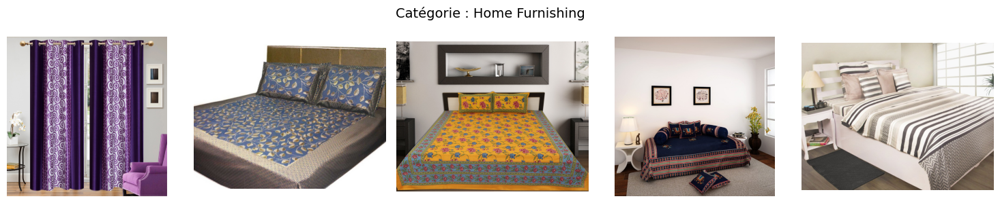

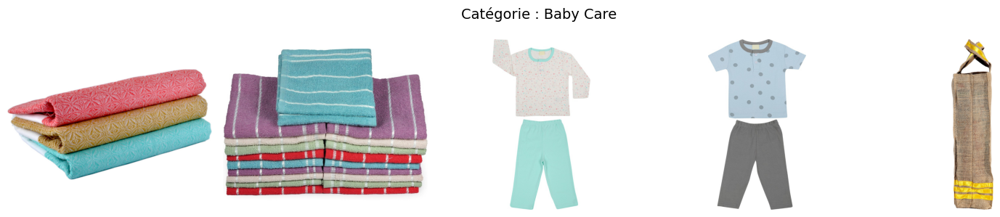

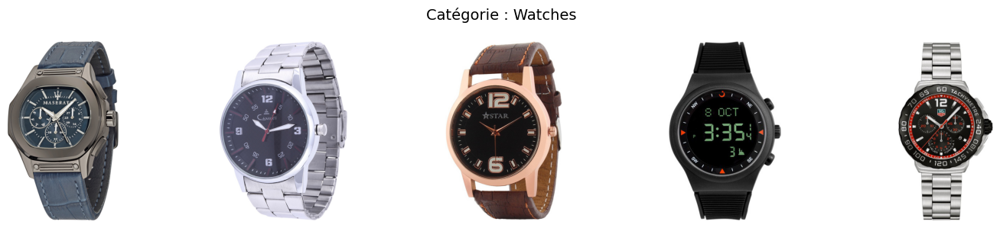

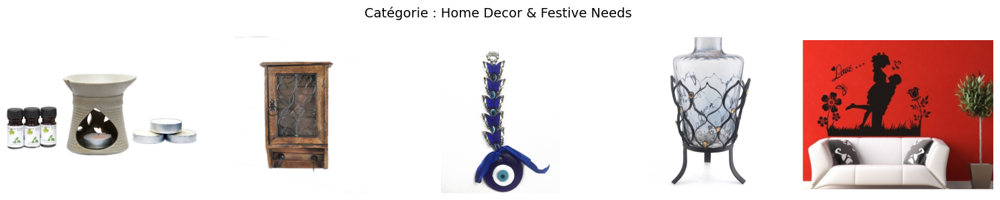

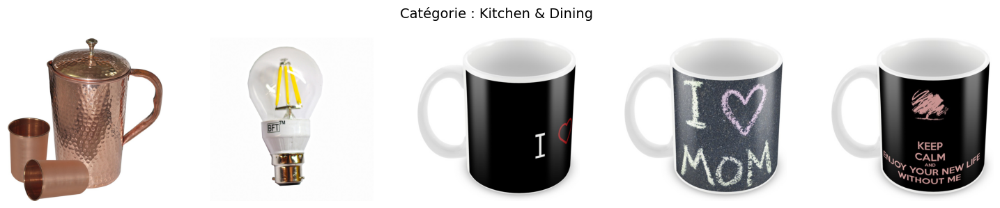

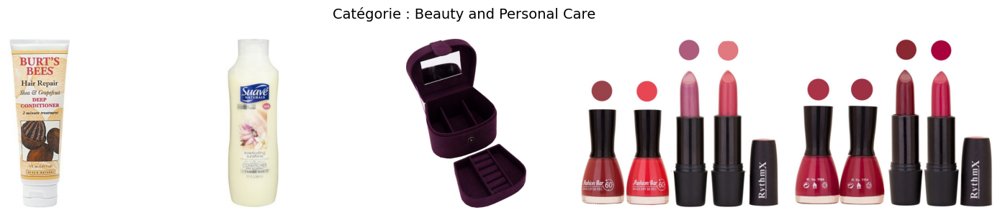

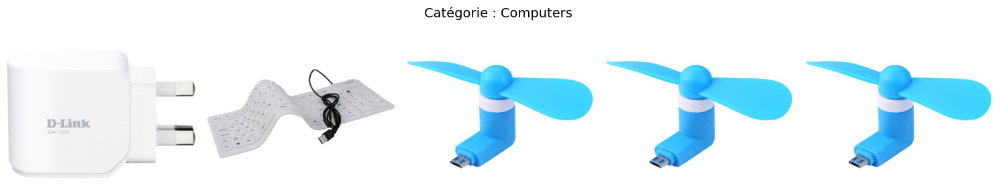

In [9]:
# Nombre d'images par catégorie
nb_images = 5

# Parcourir les catégories 
for categorie in df_image['niveau_categorie_1'].unique():
    # Filtrer les lignes correspondant à la catégorie
    df_cat = df_image[df_image['niveau_categorie_1'] == categorie].head(nb_images)
    
    # Créer une ligne de subplots
    fig, axes = plt.subplots(1, nb_images, figsize=(15, 3))
    fig.suptitle(f"Catégorie : {categorie}", fontsize=14)

    for i, (index, row) in enumerate(df_cat.iterrows()):
        try:
            image = Image.open(row['chemin_complet'])
            axes[i].imshow(image)
            axes[i].axis('off')
        except:
            axes[i].axis('off')
            axes[i].set_title("Image manquante", fontsize=8)

    plt.tight_layout()
    plt.show()

# Méthodes classiques de traitement d’image
## Prétraitement des images

Dans le cadre de l’analyse d’images, le prétraitement constitue une étape essentielle. Il permet d’améliorer la qualité visuelle des données brutes tout en facilitant l’extraction de caractéristiques discriminantes par la suite.

Les images issues de la base de données Flipkart peuvent présenter des variations de taille, de luminosité, de contraste, ou encore du bruit visuel dû à la compression ou au fond de l’image. Si elles sont utilisées telles quelles, ces imperfections risquent de nuire à la robustesse des méthodes d’analyse (comme les descripteurs SIFT ou les réseaux de neurones).

Dans cette sous-partie, nous allons donc appliquer une série de transformations simples mais efficaces pour :

- Homogénéiser le format des images,

- Réduire les informations inutiles ou parasites (bruit),

- Améliorer la lisibilité des objets présents dans les images.

Les transformations envisagées sont :

- Le redimensionnement des images pour uniformiser leurs dimensions et faciliter le traitement algorithmique,
- La conversion en niveaux de gris pour simplifier l’analyse en supprimant la composante couleur,

- Le filtrage (par exemple gaussien ou médian) pour atténuer le bruit visuel,

- L’ajustement du contraste ou de la luminosité pour faire ressortir les formes.

Ces prétraitements permettront une base propre pour l’extraction de caractéristiques visuelles à l’étape suivante.

### Redimensionnement des images

Les images présentes dans la base Flipkart sont susceptibles de présenter des résolutions variées. Cette hétérogénéité peut poser problème lors des traitements d’analyse, notamment lors de l'extraction de caractéristiques visuelles ou de l’entrée dans un algorithme de classification.

Le redimensionnement des images constitue donc une première étape fondamentale du prétraitement. Il permet d’uniformiser la taille de toutes les images, garantissant ainsi une cohérence des données d’entrée pour les étapes ultérieures, qu’il s’agisse de méthodes classiques ou de réseaux de neurones.

Dans cette section, nous allons appliquer un redimensionnement à une dimension cible commune (par exemple 224x224 pixels, souvent utilisée dans les réseaux de neurones). L’enjeu est de réduire la taille des images sans en altérer la lisibilité ou les informations visuelles clés.

L’impact de cette transformation sera évalué visuellement afin de vérifier que le redimensionnement conserve bien les formes, proportions et objets essentiels de chaque image.

Objectif : Uniformiser la taille des images pour les rendre compatibles entre elles.



In [10]:
# Créer une liste pour stocker les tailles
tailles = []

# Parcourir les chemins d'images et enregistrer leur taille
for chemin in df_image['chemin_complet']:
    try:
        with Image.open(chemin) as img:
            tailles.append(img.size)  # (largeur, hauteur)
    except Exception as e:
        print(f"Erreur pour l'image {chemin} : {e}")

# Compter les tailles uniques
from collections import Counter
compteur_tailles = Counter(tailles)

# Afficher les tailles les plus fréquentes
print("Tailles d’images les plus courantes :")
for taille, nb in compteur_tailles.most_common(10):
    print(f"Taille : {taille}, Nombre d’images : {nb}")

C:\Users\joan6\anaconda3\Lib\site-packages\PIL\Image.py:3368: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Tailles d’images les plus courantes :
Taille : (1100, 844), Nombre d’images : 23
Taille : (1100, 1100), Nombre d’images : 14
Taille : (1100, 807), Nombre d’images : 7
Taille : (1100, 1006), Nombre d’images : 6
Taille : (1100, 1048), Nombre d’images : 6
Taille : (1994, 2033), Nombre d’images : 6
Taille : (1100, 1033), Nombre d’images : 5
Taille : (979, 1100), Nombre d’images : 5
Taille : (223, 500), Nombre d’images : 5
Taille : (1088, 1100), Nombre d’images : 4


In [11]:
tailles_suspectes = [chemin for chemin in df_image['chemin_complet']
                     if Image.open(chemin).size[0] * Image.open(chemin).size[1] > 89_478_485]
print("Images suspectes :", tailles_suspectes)

Images suspectes : ['C:\\Users\\joan6\\OneDrive\\Bureau\\Projets\\Projet_6_Sole_Johanna\\Dataset+projet+prétraitement+textes+images\\Flipkart\\Images\\5518124b75d6c6dfee4c2e4c0cfa716a.jpg']


Les images présentes dans notre dataset ont des tailles variées, ce qui est tout à fait normal, mais peut poser des problèmes lors des étapes d’analyse et de traitement. Par exemple, certaines images peuvent être beaucoup plus grandes que d'autres, comme celle signalée dans le warning, où la taille excède le seuil de sécurité fixé par la bibliothèque PIL.

Le warning "DecompressionBombWarning" est généré par PIL lorsque la taille de l'image dépasse un certain nombre de pixels (ici, 89 478 485 pixels), ce qui peut indiquer un fichier potentiellement malveillant ou corrompu. Cela n’affecte pas nécessairement la qualité de l'image, mais il est important de le noter car ces fichiers peuvent être difficiles à manipuler et entraîner une surcharge mémoire si utilisés sans précaution.

In [12]:
def redimensionner_image(image_path, taille_cible=(128, 128)):
    """
    Fonction qui ouvre une image depuis un chemin, la redimensionne et la retourne.
    
    :param image_path: Chemin vers l'image.
    :param taille_cible: Taille cible sous forme de tuple (largeur, hauteur).
    :return: Image redimensionnée.
    """
    # Ouvrir l'image
    image = Image.open(image_path)
    
    # Redimensionner l'image
    image_redimensionnee = image.resize(taille_cible)
    
    return image_redimensionnee

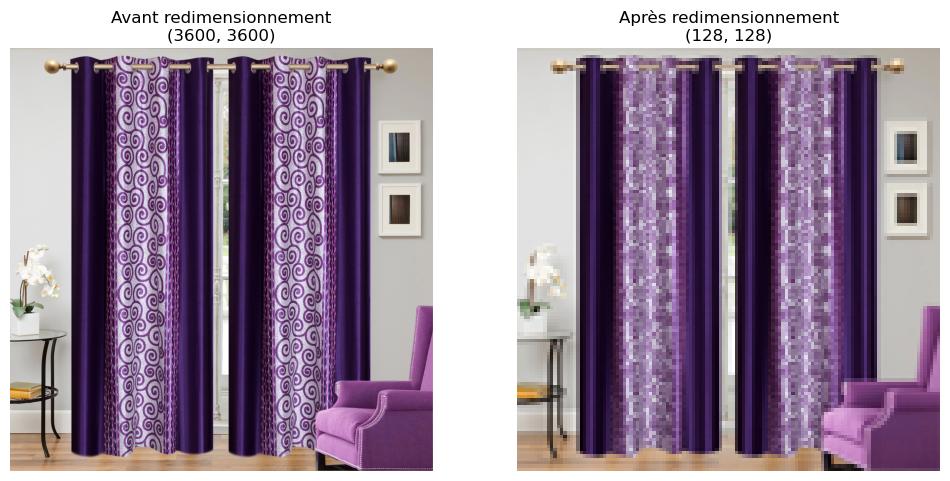

In [13]:
# Chemin de l'image à tester
chemin_image = df_image.iloc[0]['chemin_complet']

# Ouvrir l'image originale
image = Image.open(chemin_image)

# Redimensionner l'image
image_redimensionnee = redimensionner_image(chemin_image, taille_cible=(128, 128))

# Affichage avant et après
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Image avant redimensionnement
axes[0].imshow(image)
axes[0].set_title(f"Avant redimensionnement\n{image.size}")
axes[0].axis("off")

# Image après redimensionnement
axes[1].imshow(image_redimensionnee)
axes[1].set_title(f"Après redimensionnement\n{image_redimensionnee.size}")
axes[1].axis("off")

plt.show()

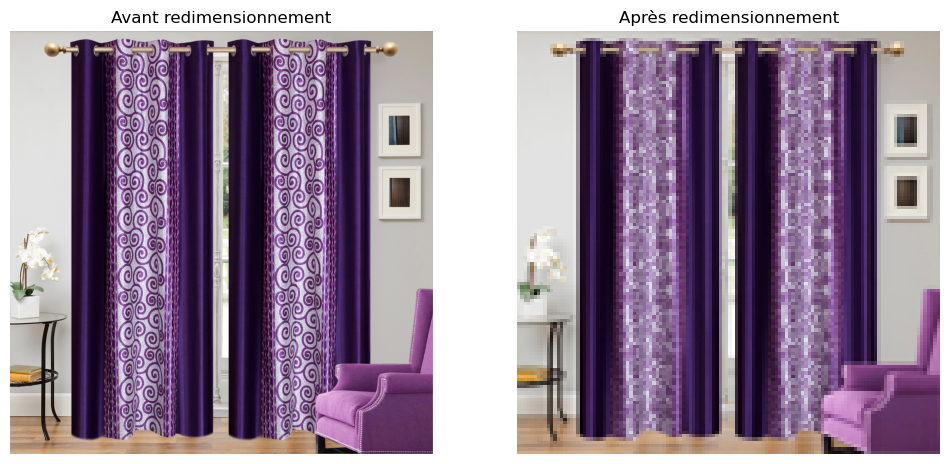

In [14]:
def traiter_images(df_image, taille_cible=(128, 128)):
    """
    Applique le redimensionnement à toutes les images dans le DataFrame.
    
    :param df_image: DataFrame contenant les chemins des images.
    :param taille_cible: Taille cible pour redimensionner les images.
    :return: Liste d'images redimensionnées.
    """
    images_redimensionnees = []
    
    for chemin_image in df_image['chemin_complet']:
        # Redimensionner chaque image et ajouter à la liste
        image_redimensionnee = redimensionner_image(chemin_image, taille_cible)
        images_redimensionnees.append(image_redimensionnee)
    
    return images_redimensionnees

# Appliquer le traitement sur toutes les images
images_redimensionnees = traiter_images(df_image, taille_cible=(128, 128))

# Affichage du résultat pour une image exemple
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Afficher l'image originale
image_exemple = Image.open(df_image.iloc[0]['chemin_complet'])
axes[0].imshow(image_exemple)
axes[0].set_title("Avant redimensionnement")
axes[0].axis("off")

# Afficher l'image redimensionnée
axes[1].imshow(images_redimensionnees[0])
axes[1].set_title("Après redimensionnement")
axes[1].axis("off")

plt.show()

### Conversion en niveaux de gris

La conversion d'images en niveaux de gris est une étape courante dans le traitement d'images, notamment lorsqu'on cherche à réduire la complexité des données tout en conservant les informations essentielles sur la structure de l'image. Les images en niveaux de gris n'ont qu'une seule composante de couleur (au lieu des trois composantes RVB : Rouge, Vert, Bleu), ce qui permet de simplifier les calculs et d'éviter les redondances.

Objectif : Réduire la complexité de l’image (1 canal au lieu de 3), tout en gardant les formes et textures.

In [15]:
def convertir_en_gris(image_path):
    """
    Convertit l'image à l'emplacement donné en niveaux de gris.
    """
    image = Image.open(image_path)
    image_gris = image.convert('L')  # 'L' pour mode niveau de gris
    return image_gris

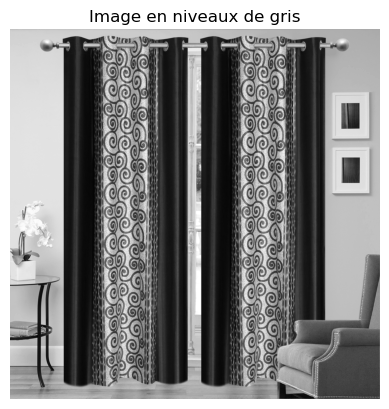

In [16]:
image_gris = convertir_en_gris(df_image.iloc[0]['chemin_complet'])

plt.imshow(image_gris, cmap='gray')
plt.title("Image en niveaux de gris")
plt.axis('off')
plt.show()

### Filtrage pour réduction du bruit

Avant d’analyser ou d’extraire des informations d’une image, il est souvent utile de réduire le bruit visuel qu’elle peut contenir. Le flou gaussien est une méthode simple mais efficace pour adoucir les contours et réduire les irrégularités, tout en préservant l’essentiel du contenu visuel. Cela permet de faciliter les traitements ultérieurs comme la segmentation ou la détection de contours.

Objectif : Supprimer les artefacts ou perturbations visuelles (pixels isolés, flou parasite).

In [17]:
def appliquer_flou_gaussien(image_path, taille_noyau=(5, 5), sigma=0):
    """
    Applique un flou gaussien à l'image spécifiée par son chemin.

    :param image_path: Chemin vers l'image.
    :param taille_noyau: Taille du noyau de flou (doit être impaire).
    :param sigma: Écart-type du filtre Gaussien. 0 = automatique.
    :return: Image filtrée.
    """
    image = Image.open(image_path)
    image_np = np.array(image)
    image_filtrée_np = cv2.GaussianBlur(image_np, taille_noyau, sigma)
    image_filtrée = Image.fromarray(image_filtrée_np)
    return image_filtrée

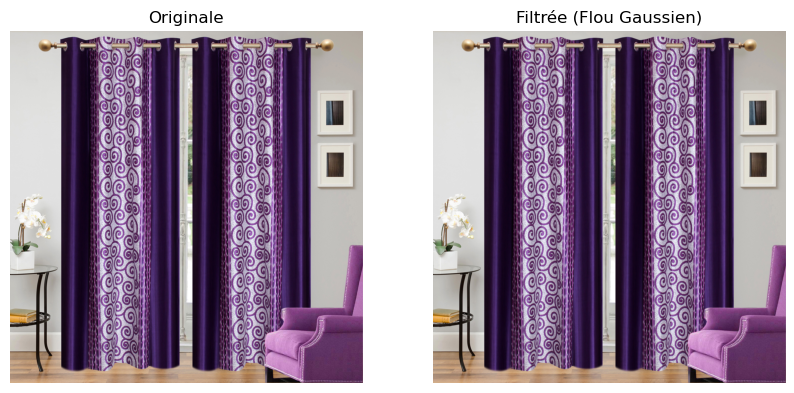

In [18]:
image_filtrée = appliquer_flou_gaussien(df_image.iloc[0]['chemin_complet'])

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Originale")
plt.imshow(Image.open(df_image.iloc[0]['chemin_complet']))
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("Filtrée (Flou Gaussien)")
plt.imshow(image_filtrée)
plt.axis("off")
plt.show()

### Ajustement du contraste / luminosité

Pour améliorer la lisibilité d’une image et mettre en valeur les éléments importants, on peut ajuster sa luminosité ou son contraste. Ces modifications permettent de renforcer les détails visuels et d’améliorer la qualité perçue, ce qui est particulièrement utile avant des traitements comme la classification ou la reconnaissance d’objets.

Objectif : Améliorer la lisibilité des formes et objets dans l’image.

In [19]:
def ajuster_contraste_luminosite(image_path, facteur_lum=1.2, facteur_contraste=1.3):
    """
    Ajuste la luminosité et le contraste d'une image à partir de son chemin.

    :param image_path: Chemin vers l'image.
    :param facteur_lum: Facteur d'ajustement de la luminosité (>1 = plus clair, <1 = plus sombre).
    :param facteur_contraste: Facteur d'ajustement du contraste (>1 = plus contrasté, <1 = moins contrasté).
    :return: Image modifiée.
    """
    image = Image.open(image_path)

    # Ajuster la luminosité
    enhanceur_lum = ImageEnhance.Brightness(image)
    image = enhanceur_lum.enhance(facteur_lum)

    # Ajuster le contraste
    enhanceur_contraste = ImageEnhance.Contrast(image)
    image = enhanceur_contraste.enhance(facteur_contraste)

    return image

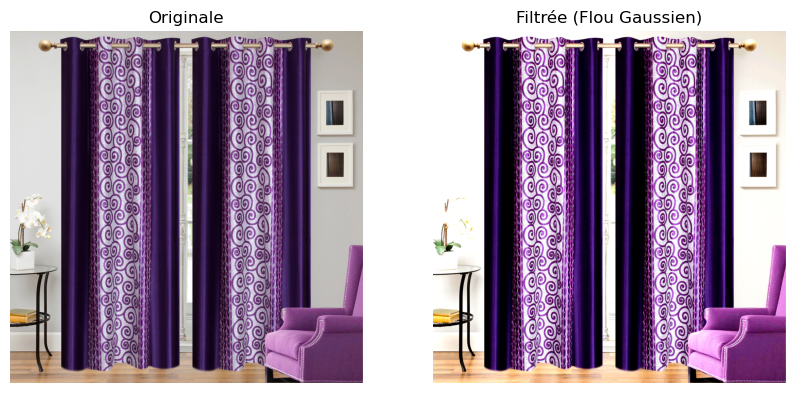

In [20]:
image_contraste = ajuster_contraste_luminosite(df_image.iloc[0]['chemin_complet'])

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Originale")
plt.imshow(Image.open(df_image.iloc[0]['chemin_complet']))
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("Filtrée (Flou Gaussien)")
plt.imshow(image_contraste)
plt.axis("off")
plt.show()

### Normalisation de l'image

La normalisation des images est une étape importante dans le prétraitement des données visuelles. Elle consiste à ajuster les valeurs des pixels de l'image pour qu'elles soient dans une plage standardisée, généralement entre 0 et 1. Cela permet de réduire l'impact des différences d'échelle entre les images et améliore la stabilité et la performance des algorithmes de traitement d'images ou de machine learning.

Objectif : Standardiser les valeurs de pixels pour faciliter les calculs et améliorer la convergence des modèles de traitement d'images.

In [21]:
def normaliser_image(image_path):
    """
    Normalise l'image à partir de son chemin, en la mettant dans l'intervalle [0, 1].

    :param image_path: Chemin vers l'image.
    :return: Image normalisée sous forme de tableau numpy.
    """
    image = Image.open(image_path)
    image_array = np.array(image)

    # Normalisation de l'image dans l'intervalle [0, 1]
    image_normalisee = image_array / 255.0

    return image_normalisee

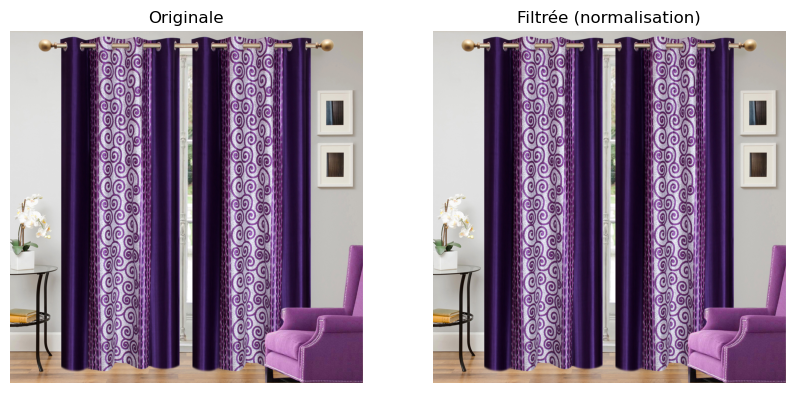

In [22]:
image_normalise = normaliser_image(df_image.iloc[0]['chemin_complet'])

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Originale")
plt.imshow(Image.open(df_image.iloc[0]['chemin_complet']))
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("Filtrée (normalisation)")
plt.imshow(image_normalise)
plt.axis("off")
plt.show()

## Évaluation des effets des transformations de prétraitement sur les images

Avant d'utiliser des images dans des modèles d'apprentissage automatique, il est crucial de comprendre l'impact de chaque transformation appliquée durant le prétraitement. Les transformations comme le redimensionnement, la conversion en niveaux de gris, la réduction du bruit, l'ajustement du contraste/luminosité et la normalisation peuvent modifier l'apparence des images de manière significative.

Cette étape d'évaluation permet de visualiser les effets de chaque transformation, d'identifier celles qui apportent des améliorations significatives à la qualité de l'image et de s'assurer que les transformations choisies préservent les informations importantes tout en éliminant les éléments non pertinents ou nuisibles. En testant différentes transformations sur un échantillon d'images, on peut mieux comprendre comment elles affectent la reconnaissance des motifs et la performance des modèles d'analyse d'image.

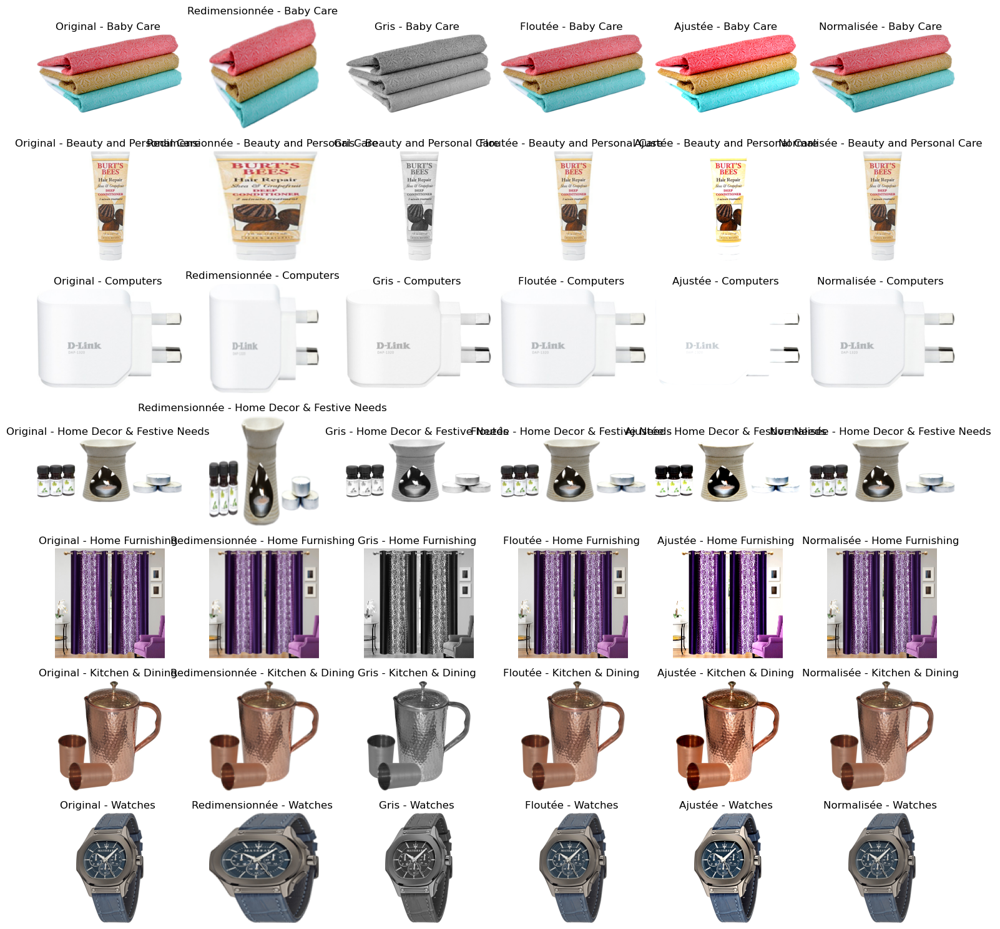

In [23]:
# Sélectionner une image par catégorie
categories = df_image['niveau_categorie_1'].unique()
selected_images = df_image.groupby('niveau_categorie_1').first().reset_index()

# Afficher les images avant et après pré-traitement
plt.figure(figsize=(15, 15))
for idx, row in selected_images.iterrows():
    image_path = row['chemin_complet']  # Utiliser le chemin complet de l'image

    if os.path.exists(image_path):
        # Appliquer les transformations
        image_redimensionnee = redimensionner_image(image_path)
        image_gris = convertir_en_gris(image_path)
        image_floutée = appliquer_flou_gaussien(image_path)
        image_ajustee = ajuster_contraste_luminosite(image_path)
        image_normalisee = normaliser_image(image_path)
        
        # Afficher l'image originale
        plt.subplot(len(categories), 6, 6*idx + 1)
        plt.title(f"Original - {row['niveau_categorie_1']}")
        plt.imshow(Image.open(image_path))
        plt.axis('off')
        
        # Afficher l'image redimensionnée
        plt.subplot(len(categories), 6, 6*idx + 2)
        plt.title(f"Redimensionnée - {row['niveau_categorie_1']}")
        plt.imshow(image_redimensionnee)
        plt.axis('off')
        
        # Afficher l'image en niveaux de gris
        plt.subplot(len(categories), 6, 6*idx + 3)
        plt.title(f"Gris - {row['niveau_categorie_1']}")
        plt.imshow(image_gris, cmap='gray')
        plt.axis('off')
        
        # Afficher l'image floutée
        plt.subplot(len(categories), 6, 6*idx + 4)
        plt.title(f"Floutée - {row['niveau_categorie_1']}")
        plt.imshow(image_floutée)
        plt.axis('off')
        
        # Afficher l'image ajustée (luminosité/contraste)
        plt.subplot(len(categories), 6, 6*idx + 5)
        plt.title(f"Ajustée - {row['niveau_categorie_1']}")
        plt.imshow(image_ajustee)
        plt.axis('off')
        
        # Afficher l'image normalisée
        plt.subplot(len(categories), 6, 6*idx + 6)
        plt.title(f"Normalisée - {row['niveau_categorie_1']}")
        plt.imshow(image_normalisee)
        plt.axis('off')

plt.tight_layout()
plt.show()

Redimensionnement : Légère déformation sur certaines images (étirement), mais la lisibilité globale reste satisfaisante.

Conversion en niveaux de gris : Aucun problème visuel notable, les formes et objets restent bien identifiables.

Flou gaussien : La réduction du bruit est effective sans perte significative de détails visuels.

Ajustement contraste/luminosité : Une image contenant un objet clair (mug blanc) est devenue moins visible, suggérant que ce traitement pourrait altérer certaines images.

Normalisation : Aucun effet visuel gênant n’a été observé, la transformation est neutre à l’œil nu mais utile pour les algorithmes.

## Application combinée des transformations de prétraitement

Après avoir observé séparément les effets de chaque traitement, cette section applique l’ensemble des transformations sur une image par catégorie, afin de valider leur enchaînement et d’en observer le rendu final.

Lors de l'analyse des étapes précédentes, il a été constaté que l'ajustement de la luminosité et du contraste pouvait avoir un impact significatif sur la visibilité des objets dans l'image. En particulier, une image contenant un objet clair (comme un mug blanc) est devenue moins visible après avoir appliqué un contraste et une luminosité plus élevés. Cela a suggéré que des valeurs trop extrêmes pour ces paramètres pouvaient altérer certaines images de manière indésirable, notamment en rendant les objets lumineux moins distincts.

Pour éviter ce problème tout en maintenant un contraste suffisant pour les autres éléments de l'image, les facteurs de luminosité et de contraste seront ajustés.

In [24]:
def traitement_cumulé(image_path):
    """
    Applique une série de pré-traitements à une image depuis son chemin d'accès.

    Ce pipeline inclut les étapes suivantes :
    1. Chargement de l'image.
    2. Redimensionnement à 128x128 pixels.
    3. Conversion en niveaux de gris.
    4. Application d'un flou gaussien (5x5).
    5. Ajustement de la luminosité (facteur 1.1).
    6. Ajustement du contraste (facteur 1.1).
    7. Normalisation des pixels dans l'intervalle [0, 1].

    :param image_path: str - Chemin vers l'image à traiter.
    :return: np.ndarray - Image pré-traitée sous forme de tableau NumPy normalisé.
    """
    # Lire l'image une seule fois
    image = Image.open(image_path)

    # Redimensionner
    image = image.resize((128, 128))

    # Convertir en niveaux de gris
    image = image.convert('L')

    # Appliquer un flou gaussien (avec OpenCV donc on passe par NumPy)
    image_np = np.array(image)
    image_np = cv2.GaussianBlur(image_np, (5, 5), 0)
    image = Image.fromarray(image_np)

     # Ajuster luminosité et contraste avec des facteurs plus modérés
    image = ImageEnhance.Brightness(image).enhance(0.9)  # Luminosité réduite pour moins de blanc éclatant
    image = ImageEnhance.Contrast(image).enhance(1.05)  # Contraste plus faible pour éviter l'écrasement des blancs

    # Normaliser (en dernier, car retourne un tableau)
    image_np = np.array(image)
    image_np = image_np / 255.0

    return image_np

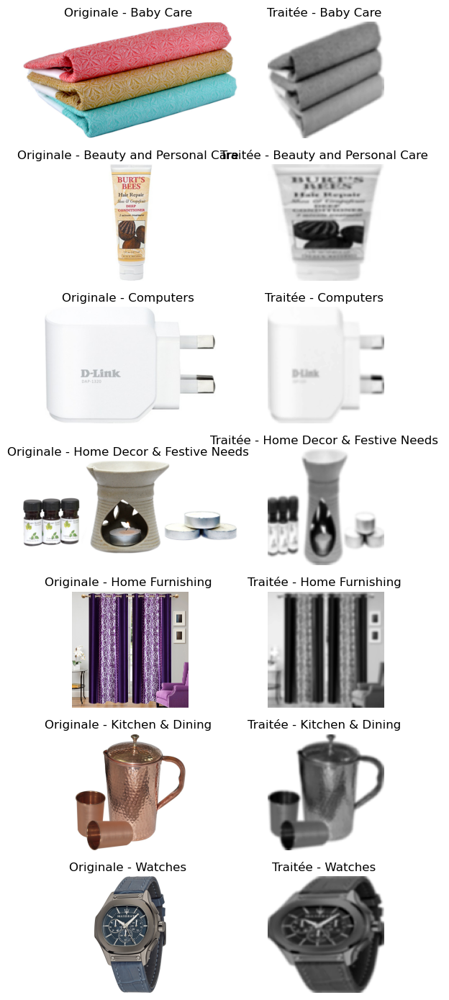

In [25]:
# Sélectionner une image par catégorie
categories = df_image['niveau_categorie_1'].unique()
selected_images = df_image.groupby('niveau_categorie_1').first().reset_index()

# Afficher les images avant et après le traitement cumulé
plt.figure(figsize=(6, 2 * len(categories)))

for idx, row in selected_images.iterrows():
    image_path = row['chemin_complet']  # Utiliser le chemin complet de l'image

    if os.path.exists(image_path):
        # Image originale
        image_originale = Image.open(image_path)

        # Image après traitement cumulé
        image_traitee_np = traitement_cumulé(image_path)
        image_traitee = Image.fromarray((image_traitee_np * 255).astype(np.uint8))  # Reconversion pour affichage

        # Afficher l'image originale
        plt.subplot(len(categories), 2, 2 * idx + 1)
        plt.title(f"Originale - {row['niveau_categorie_1']}")
        plt.imshow(image_originale)
        plt.axis('off')

        # Afficher l'image après traitement
        plt.subplot(len(categories), 2, 2 * idx + 2)
        plt.title(f"Traitée - {row['niveau_categorie_1']}")
        plt.imshow(image_traitee, cmap='gray')
        plt.axis('off')

plt.tight_layout()
plt.show()

Après avoir appliqué l'ensemble des transformations de prétraitement, il a été observé que l'ajustement du contraste fonctionne de manière satisfaisante. Le contraste des images a été modifié efficacement, permettant de mieux distinguer les différents éléments visuels, tout en préservant la lisibilité des objets clairs, comme les mugs blancs, qui étaient initialement difficiles à distinguer avec des réglages plus extrêmes.

Cependant, un léger flou reste perceptible sur certaines images après l'application du flou gaussien. Ce flou, bien que peu gênant dans certains cas, peut altérer la précision des détails fins et la netteté de l'image. Afin de résoudre ce problème, il sera nécessaire de réduire davantage l'intensité du flou appliqué lors de l'étape de prétraitement. Ce réglage permettra de maintenir une image plus nette tout en conservant les autres améliorations, notamment en termes de contraste et de luminosité.

Ainsi, bien que le contraste soit désormais optimisé, l'ajustement du flou sera la prochaine étape pour obtenir une image encore plus précise et mieux adaptée à l'analyse.

In [26]:
def traitement_cumulé(image_path):
    """
    Applique une série de pré-traitements à une image depuis son chemin d'accès.

    Ce pipeline inclut les étapes suivantes :
    1. Chargement de l'image.
    2. Redimensionnement à 128x128 pixels.
    3. Conversion en niveaux de gris.
    4. Application d'un flou gaussien (5x5).
    5. Ajustement de la luminosité (facteur 1.1).
    6. Ajustement du contraste (facteur 1.1).
    7. Normalisation des pixels dans l'intervalle [0, 1].

    :param image_path: str - Chemin vers l'image à traiter.
    :return: np.ndarray - Image pré-traitée sous forme de tableau NumPy normalisé.
    """
    # Lire l'image une seule fois
    image = Image.open(image_path)

    # Redimensionner
    image = image.resize((128, 128))

    # Convertir en niveaux de gris
    image = image.convert('L')

    # Appliquer un flou gaussien (avec OpenCV donc on passe par NumPy)
    image_np = np.array(image)
    image_np = cv2.GaussianBlur(image_np, (1, 1), 0)  # Très léger flou
    image = Image.fromarray(image_np)

     # Ajuster luminosité et contraste avec des facteurs plus modérés
    image = ImageEnhance.Brightness(image).enhance(0.9)  # Luminosité réduite pour moins de blanc éclatant
    image = ImageEnhance.Contrast(image).enhance(1.05)  # Contraste plus faible pour éviter l'écrasement des blancs

    # Normaliser (en dernier, car retourne un tableau)
    image_np = np.array(image)
    image_np = image_np / 255.0

    return image_np

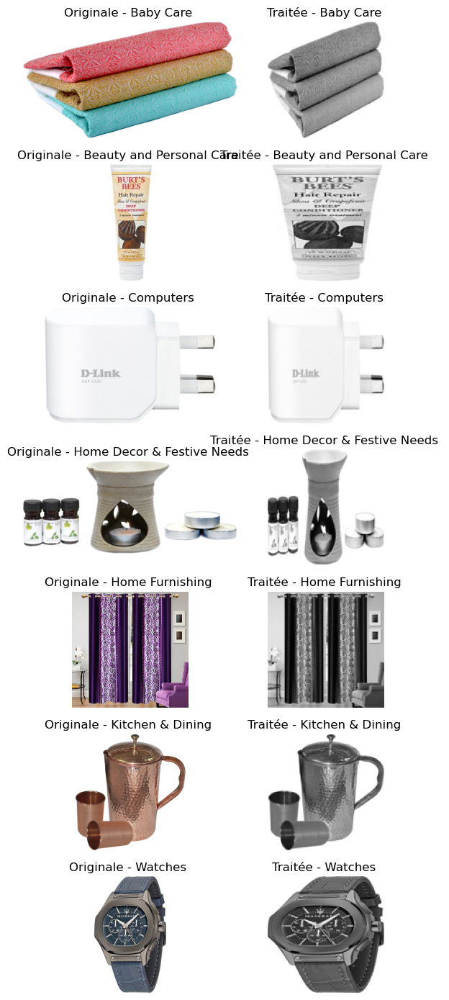

In [27]:
# Sélectionner une image par catégorie
categories = df_image['niveau_categorie_1'].unique()
selected_images = df_image.groupby('niveau_categorie_1').first().reset_index()

# Afficher les images avant et après le traitement cumulé
plt.figure(figsize=(6, 2 * len(categories)))

for idx, row in selected_images.iterrows():
    image_path = row['chemin_complet']  # Utiliser le chemin complet de l'image

    if os.path.exists(image_path):
        # Image originale
        image_originale = Image.open(image_path)

        # Image après traitement cumulé
        image_traitee_np = traitement_cumulé(image_path)
        image_traitee = Image.fromarray((image_traitee_np * 255).astype(np.uint8))  # Reconversion pour affichage

        # Afficher l'image originale
        plt.subplot(len(categories), 2, 2 * idx + 1)
        plt.title(f"Originale - {row['niveau_categorie_1']}")
        plt.imshow(image_originale)
        plt.axis('off')

        # Afficher l'image après traitement
        plt.subplot(len(categories), 2, 2 * idx + 2)
        plt.title(f"Traitée - {row['niveau_categorie_1']}")
        plt.imshow(image_traitee, cmap='gray')
        plt.axis('off')

plt.tight_layout()
plt.show()

Après avoir ajusté l'intensité du flou gaussien, les images sont désormais beaucoup plus nettes tout en conservant un bon contraste. Le flou a été réduit suffisamment pour éviter toute perte de détails, tout en maintenant les améliorations apportées au contraste et à la luminosité. Ainsi, le prétraitement est maintenant optimisé et les images sont prêtes pour l'analyse.


## Application des transformations de prétraitement sur l'ensemble du DataFrame
Dans cette section, nous appliquons les différentes étapes de prétraitement des images, que nous avons explorées précédemment, à l'ensemble des images du DataFrame. Chaque image passera par une série de transformations, telles que le redimensionnement, la conversion en niveaux de gris, la réduction du bruit, l'ajustement du contraste et la normalisation. L'objectif est de préparer les images de manière cohérente et uniforme pour les étapes suivantes, notamment l'entraînement de modèles d'apprentissage automatique ou d'autres analyses basées sur ces images. Ces transformations visent à améliorer la qualité des images et à les rendre plus adaptées à l'analyse, tout en augmentant la robustesse du modèle grâce à l'augmentation de la diversité des données.

In [28]:
# Créer le dossier pour les images traitées
dossier_sortie = "images_traitees"
os.makedirs(dossier_sortie, exist_ok=True)

# Fonction pour traiter, enregistrer et retourner le nouveau chemin
def traiter_et_sauvegarder(image_path, nom_sortie):
    """
    Applique un pipeline de traitement d'image à partir d'un chemin d'image, 
    enregistre l'image traitée dans un dossier dédié, et retourne son nouveau chemin.

    Étapes de traitement :
    - Redimensionnement à 128x128 pixels
    - Conversion en niveaux de gris
    - Flou gaussien léger
    - Réduction de la luminosité (0.9)
    - Augmentation du contraste (1.05)
    - Normalisation des pixels entre 0 et 1
    - Sauvegarde de l'image traitée sous forme JPEG

    :param image_path: str - Chemin vers l'image d'origine.
    :param nom_sortie: str - Nom du fichier pour l'image traitée.
    :return: str - Chemin d'accès de l'image traitée enregistrée.
    """
    image_np = traitement_cumulé(image_path)
    image_pil = Image.fromarray((image_np * 255).astype(np.uint8))  # Reconverti en image PIL pour sauvegarde

    chemin_sortie = os.path.join(dossier_sortie, nom_sortie)
    image_pil.save(chemin_sortie)

    return chemin_sortie

In [29]:
# Appliquer le traitement à chaque ligne du DataFrame
# Si le chemin existe, traite l'image, sinon retourne None
# Appliquer à toutes les images et créer une nouvelle colonne
df_image['chemin_image_traitee'] = df_image.apply(
    lambda row: traiter_et_sauvegarder(
        row['chemin_complet'],
        f"{os.path.splitext(os.path.basename(row['chemin_complet']))[0]}_traitee.jpg"
    ) if os.path.exists(row['chemin_complet']) else None,
    axis=1
)
# Créer une colonne avec le nom de l'image traitée (sans le chemin complet)
df_image['nom_image_traitee'] = df_image['chemin_image_traitee'].apply(
    lambda x: os.path.basename(x) if x is not None else None
)

C:\Users\joan6\anaconda3\Lib\site-packages\PIL\Image.py:3368: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


In [30]:
df_image.head()

,image,niveau_categorie_1,chemin_complet,chemin_image_traitee,nom_image_traitee
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...,images_traitees\55b85ea15a1536d46b7190ad6fff8c...,55b85ea15a1536d46b7190ad6fff8ce7_traitee.jpg
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...,images_traitees\7b72c92c2f6c40268628ec5f14c6d5...,7b72c92c2f6c40268628ec5f14c6d590_traitee.jpg
2,64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...,images_traitees\64d5d4a258243731dc7bbb1eef49ad...,64d5d4a258243731dc7bbb1eef49ad74_traitee.jpg
3,d4684dcdc759dd9cdf41504698d737d8.jpg,Home Furnishing,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...,images_traitees\d4684dcdc759dd9cdf41504698d737...,d4684dcdc759dd9cdf41504698d737d8_traitee.jpg
4,6325b6870c54cd47be6ebfbffa620ec7.jpg,Home Furnishing,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...,images_traitees\6325b6870c54cd47be6ebfbffa620e...,6325b6870c54cd47be6ebfbffa620ec7_traitee.jpg


In [31]:
df_image.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   image                 1050 non-null   object
 1   niveau_categorie_1    1050 non-null   object
 2   chemin_complet        1050 non-null   object
 3   chemin_image_traitee  1050 non-null   object
 4   nom_image_traitee     1050 non-null   object
dtypes: object(5)
memory usage: 41.1+ KB


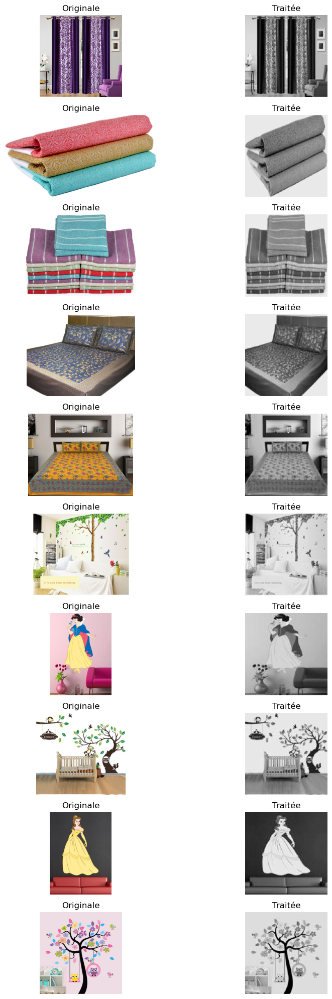

In [32]:
# Afficher les 5 premières et 5 dernières images avant et après traitement
fig, axes = plt.subplots(10, 2, figsize=(10, 20))  # 10 lignes, 2 colonnes pour afficher 10 images

# Afficher les 5 premières images
for idx, row in df_image.head(5).iterrows():
    # Image originale
    image_originale = Image.open(row['chemin_complet'])
    axes[idx, 0].imshow(image_originale)
    axes[idx, 0].set_title(f"Originale")
    axes[idx, 0].axis('off')

    # Image traitée (en niveaux de gris)
    image_traitee = Image.open(row['chemin_image_traitee'])
    axes[idx, 1].imshow(image_traitee, cmap='gray')  # Ajout de cmap='gray' pour afficher en niveaux de gris
    axes[idx, 1].set_title(f"Traitée")
    axes[idx, 1].axis('off')

# Afficher les 5 dernières images
for idx, row in df_image.tail(5).iterrows():
    # Index relatif pour la deuxième moitié des images (5 dernières)
    rel_idx = idx - df_image.tail(5).index[0] + 5  # Correction de l'index relatif
    # Image originale
    image_originale = Image.open(row['chemin_complet'])
    axes[rel_idx, 0].imshow(image_originale)
    axes[rel_idx, 0].set_title(f"Originale")
    axes[rel_idx, 0].axis('off')

    # Image traitée (en niveaux de gris)
    image_traitee = Image.open(row['chemin_image_traitee'])
    axes[rel_idx, 1].imshow(image_traitee, cmap='gray')  # Ajout de cmap='gray' pour afficher en niveaux de gris
    axes[rel_idx, 1].set_title(f"Traitée")
    axes[rel_idx, 1].axis('off')

plt.tight_layout()
plt.show()

In [39]:
df_image_copie = df_image[['niveau_categorie_1', 'chemin_image_traitee', 'nom_image_traitee']].copy()

In [40]:
df_image_copie.head()

,niveau_categorie_1,chemin_image_traitee,nom_image_traitee
0,Home Furnishing,images_traitees\55b85ea15a1536d46b7190ad6fff8c...,55b85ea15a1536d46b7190ad6fff8ce7_traitee.jpg
1,Baby Care,images_traitees\7b72c92c2f6c40268628ec5f14c6d5...,7b72c92c2f6c40268628ec5f14c6d590_traitee.jpg
2,Baby Care,images_traitees\64d5d4a258243731dc7bbb1eef49ad...,64d5d4a258243731dc7bbb1eef49ad74_traitee.jpg
3,Home Furnishing,images_traitees\d4684dcdc759dd9cdf41504698d737...,d4684dcdc759dd9cdf41504698d737d8_traitee.jpg
4,Home Furnishing,images_traitees\6325b6870c54cd47be6ebfbffa620e...,6325b6870c54cd47be6ebfbffa620ec7_traitee.jpg


## Extraction de caractéristiques d'images avec SIFT

L'extraction de caractéristiques est essentielle pour l'analyse des images. L'algorithme SIFT (Scale-Invariant Feature Transform) permet de détecter des points d'intérêt dans les images qui sont invariants aux transformations de taille, de rotation et de translation. Dans cette section, nous allons appliquer SIFT pour extraire des points d'intérêt et leurs descripteurs, facilitant ainsi les étapes de reconnaissance ou de classification d'images suivantes.

### Détection des points d’intérêt avec SIFT
Dans cette section, nous allons appliquer l'algorithme SIFT (Scale-Invariant Feature Transform) sur une image pour détecter des points d’intérêt robustes aux variations d’échelle, de rotation et de luminosité. Ces points clés représentent les zones distinctives de l’image et sont associés à des descripteurs numériques. L’objectif ici est de visualiser ces points sur une image sélectionnée afin de comprendre comment SIFT identifie les zones informatives d’une image.

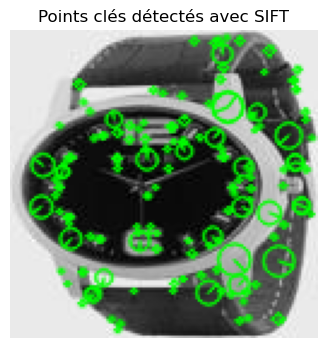

In [41]:
# Lire l'image en niveau de gris
image_path = df_image_copie.iloc[7]['chemin_image_traitee']
img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Initialiser SIFT
sift = cv2.SIFT_create()

# Détecter les keypoints et descripteurs
keypoints, descriptors = sift.detectAndCompute(img, None)

# Trier les keypoints selon leur "response" (force)
keypoints = sorted(keypoints, key=lambda x: -x.response)

# Dessiner les keypoints
img_with_keypoints = cv2.drawKeypoints(
    img, keypoints, None,
    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS,
    color=(0, 255, 0)
)

# Affichage
plt.figure(figsize=(4, 4))
plt.imshow(img_with_keypoints, cmap='gray')
plt.axis('off')
plt.title('Points clés détectés avec SIFT')
plt.show()

Les points clés détectés par SIFT sont concentrés autour des bords de la montre, où les changements de contraste sont les plus marqués. Cela montre que l'algorithme a bien identifié les zones les plus intéressantes de l'image, telles que les contours et les détails de la montre, ce qui est idéal pour des tâches de reconnaissance et de correspondance d'images.

Imaginons un grand sac de LEGO<br>
Étape 1 : Extraire les pièces (descripteurs SIFT)<br>
Chaque image est comme une petite construction faite de plusieurs petites pièces LEGO (les descripteurs SIFT).<br>
Chaque pièce LEGO a une forme et une couleur (c’est le vecteur de 128 nombres).<br>
Pour chaque image, on récupère toutes ses pièces LEGO.<br>

Étape 2 : Regrouper toutes les pièces LEGO de toutes les images dans un grand sac<br>
On prend toutes les pièces LEGO de toutes les images et on les met dans un grand sac.<br>
Ce sac contient des milliers de pièces LEGO différentes.<br>

Étape 3 : Trier les pièces LEGO en 200 catégories (selon le k choisit par la méthode du coude par exemple)<br>
Maintenant, on veut organiser ce grand sac de pièces en 200 boîtes, chacune contenant des pièces similaires.<br>
Pour cela, on utilises un algorithme (KMeans) qui regarde la forme et la couleur des pièces et les regroupe par similarité.<br>
Chaque boîte correspond à un "mot visuel" (un type de pièce LEGO).<br>

Étape 4 : Revenir à chaque image et compter ses pièces dans chaque boîte (créer des histogammes visuels)<br>
Pour chaque image, on regarde ses pièces LEGO une par une.<br>
Pour chaque pièce, on regarde dans quelle boîte à appartient (c’est-à-dire de quel groupe elle est la plus proche).<br>
On compte combien de pièces de l’image sont dans chaque boîte.<br>

Étape 5 : Résultat final = un tableau de 200 nombres par image<br>
Pour chaque image, on a un tableau de 200 nombres, où chaque nombre est le nombre de pièces dans une boîte.<br>
Ce tableau est appelé un histogramme de mots visuels.<br>
Il représente l’image par rapport aux 200 types de motifs visuels qu'on a définis.<br>

Pourquoi on fait ça ?<br>
Parce que chaque image a un nombre différent de pièces (descripteurs), on ne peut pas comparer directement.<br>
En regroupant les pièces dans des catégories communes, on transforme chaque image en un vecteur de taille fixe (200).<br>
Ce vecteur est facile à utiliser pour comparer, classifier ou faire du clustering.

In [43]:
# Initialiser SIFT
sift = cv2.SIFT_create()

# Pour stocker tous les descripteurs de toutes les images
all_descriptors = []

# Pour stocker, pour chaque image, ses descripteurs 
descriptors_list_per_image = []

for idx, row in tqdm(df_image_copie.iterrows(), total=len(df_image_copie)):
    image_path = row['chemin_image_traitee']
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        # Image manquante ou corrompue
        descriptors_list_per_image.append(None)
        continue
    keypoints, descriptors = sift.detectAndCompute(img, None)
    if descriptors is not None:
        all_descriptors.append(descriptors)
        descriptors_list_per_image.append(descriptors)
    else:
        # Pas de points détectés
        descriptors_list_per_image.append(None)

# Fusionner tous les descripteurs en une seule grande matrice pour KMeans
all_descriptors_stacked = np.vstack([desc for desc in all_descriptors if desc is not None])
print("Shape descripteurs globaux :", all_descriptors_stacked.shape)

100%|█████████████████████████████████████████████████████████████████████████████| 1050/1050 [00:07<00:00, 141.72it/s]

Shape descripteurs globaux : (116383, 128)


### Construction du dictionnaire visuel : regroupement des motifs SIFT en "mots visuels"

Pour pouvoir comparer et regrouper automatiquement nos images, nous devons transformer les informations extraites par SIFT en une représentation commune et compacte.

La démarche consiste à :

- Rassembler tous les descripteurs SIFT extraits de toutes les images dans un grand ensemble unique, comme si on mélangeait toutes les pièces LEGO de toutes les images dans un même sac.

- Regrouper ces descripteurs en un nombre fixe de catégories (appelées "mots visuels"), en utilisant l’algorithme de clustering KMeans. Chaque catégorie regroupe des descripteurs similaires, un peu comme si on rangeait toutes les pièces LEGO par forme/couleur dans différentes boîtes.

- Déterminer le nombre optimal de catégories (K) : pour choisir le nombre de "mots visuels" à créer, on utilise la méthode du coude ("elbow method"). Cette méthode consiste à faire tourner KMeans pour différentes valeurs de K, puis à observer la courbe de l’inertie afin de repérer le point où augmenter K n’apporte plus de gain significatif. Ce point correspond au "coude" de la courbe et indique une bonne valeur pour K.

- Chaque boîte représente un motif visuel récurrent dans l’ensemble de nos images.

- Ce dictionnaire de "mots visuels" servira ensuite à représenter chaque image de façon standardisée, en comptant combien de ses descripteurs appartiennent à chaque boîte.

Cette étape est essentielle pour passer d’une description variable et complexe (beaucoup de petits morceaux différents pour chaque image) à une représentation simple, comparable et utilisable pour la classification automatique

#### Déterminer le nombre optimal de "mots visuels"
Pour exploiter efficacement les milliers de descripteurs SIFT extraits de nos images, il est nécessaire de les regrouper en un nombre limité de catégories, appelées "mots visuels". Cette étape permet de transformer chaque image en un histogramme de mots visuels, facilitant ainsi la comparaison et l’analyse des images.

Le regroupement des descripteurs similaires s’effectue à l’aide d’un algorithme de clustering, ici MiniBatchKMeans, qui est une version rapide et adaptée aux grands volumes de données du classique KMeans.

Le choix du nombre de groupes (K) est une étape cruciale :

- Un K trop faible limite la capacité de discrimination du modèle,

- Un K trop élevé augmente la complexité et le risque de sur-apprentissage.

Pour déterminer la valeur optimale de K, nous utilisons la méthode du coude (“elbow method”) :

- Nous faisons tourner MiniBatchKMeans pour différentes valeurs de K (ici, de 20 à 500 par pas de 20).

- Pour chaque K, nous calculons l’inertie (la somme des distances intra-cluster), qui mesure la compacité des groupes formés.

- Nous traçons la courbe de l’inertie en fonction de K et cherchons le point où la diminution de l’inertie commence à ralentir : c’est le “coude” de la courbe, qui indique un bon compromis entre compacité et complexité.

- Pour automatiser ce choix, nous calculons la dérivée seconde de l’inertie afin de localiser précisément ce point de coude.

Le code suivant réalise ces étapes, affiche la courbe de la méthode du coude, et indique automatiquement la valeur optimale de K à utiliser pour la création du dictionnaire de mots visuels.

Autres méthodes empiriques pour choisir K : 
- la racine carrée du nombre de descripteurs (ici racine carrée de 116383 ≈341).
- 10 fois le nombre de catégories (Nous avons 7 catégories donc k = 70). 

100%|██████████████████████████████████████████████████████████████████████████████████| 25/25 [00:30<00:00,  1.23s/it]


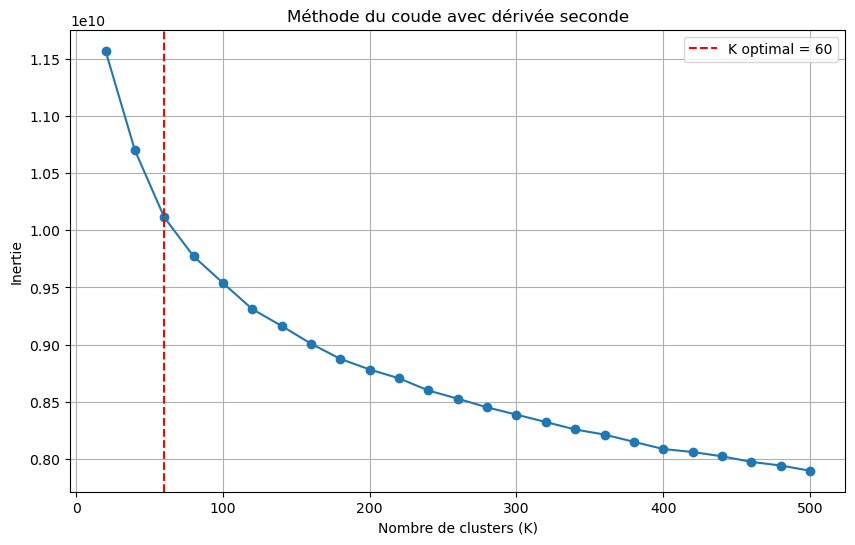

K optimal calculé : 60


In [45]:
# Liste pour stocker les inerties (mesure de la compacité des clusters pour chaque K)
inertias = []

# Plage de valeurs de K à tester (de 20 à 500, par pas de 20)
K_values = range(20, 501, 20)

for k in tqdm(K_values):
    # Initialisation du modèle MiniBatchKMeans
    kmeans = MiniBatchKMeans(
        n_clusters=k,      # Nombre de clusters à former (nombre de "mots visuels")
        random_state=42,   # Pour la reproductibilité des résultats
        init_size=3*k,     # Taille de l'échantillon initial pour le centrage des clusters (+ grand = meilleure initialisation)
        batch_size=2048    # Nb d'échantillons traités à chaque itération (accélère le calcul sur de gros jeux de données)
    )

    # Entraînement du MiniBatchKMeans sur tous les descripteurs SIFT empilés
    kmeans.fit(all_descriptors_stacked)
    
    # Stockage de l'inertie
    inertias.append(kmeans.inertia_)

# Calcul de la dérivée seconde de l'inertie pour détecter le "coude"
second_derivatives = np.diff(inertias, 2)  

# Recherche de l'indice où la courbure est maximale (coude)
optimal_index = np.argmax(second_derivatives)

# Ajustement d'indice (+2) pour retrouver la valeur de K correspondante
optimal_k = K_values[optimal_index + 2]

# Affichage du graphique de la méthode du coude avec indication du K optimal
plt.figure(figsize=(10, 6))
plt.plot(K_values, inertias, marker='o')
plt.axvline(x=optimal_k, color='r', linestyle='--', label=f'K optimal = {optimal_k}')
plt.xlabel("Nombre de clusters (K)")
plt.ylabel("Inertie")
plt.title("Méthode du coude avec dérivée seconde")
plt.legend()
plt.grid(True)
plt.show()

print(f"K optimal calculé : {optimal_k}")

In [46]:
K = 60 

kmeans = KMeans(n_clusters=K, random_state=42, n_init=10)
kmeans.fit(all_descriptors_stacked)

# Les centres de clusters sont tes "mots visuels"
visual_words = kmeans.cluster_centers_

#### Représenter chaque image par un histogramme de mots visuels

Pour chaque image, nous procédons ainsi :

- On prend ses descripteurs SIFT

- Pour chaque descripteur, on cherche le "mot visuel" (cluster) le plus proche dans le dictionnaire

- On compte combien de descripteurs de l’image appartiennent à chaque mot visuel

- On obtient ainsi un histogramme (vecteur de 60 valeurs) qui résume la composition visuelle de l’image

Cette représentation vectorielle, de taille fixe pour toutes les images, est désormais prête à être utilisée pour la suite de l’analyse (réduction de dimension, visualisation, clustering, etc.).

In [47]:
# Pour stocker les histogrammes de toutes les images
image_histograms = []

for descriptors in descriptors_list_per_image:
    if descriptors is not None:
        # Trouver le cluster le plus proche pour chaque descripteur
        words = kmeans.predict(descriptors)
        # Construire l'histogramme (200 bins)
        hist, _ = np.histogram(words, bins=np.arange(K+1))
        # Normaliser 
        hist = hist / hist.sum() if hist.sum() > 0 else hist
    else:
        # Si pas de descripteur, histogramme nul
        hist = np.zeros(K)
    image_histograms.append(hist)

# Convertir en array numpy pour la suite
image_histograms = np.array(image_histograms)
print("Shape des histogrammes :", image_histograms.shape)  # (nb_images, 200)

Shape des histogrammes : (1050, 60)


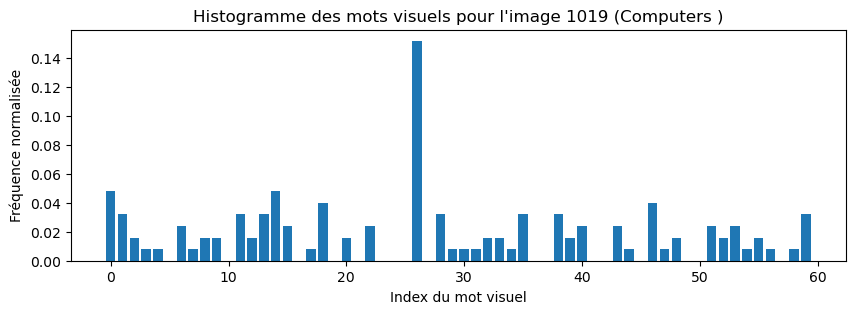

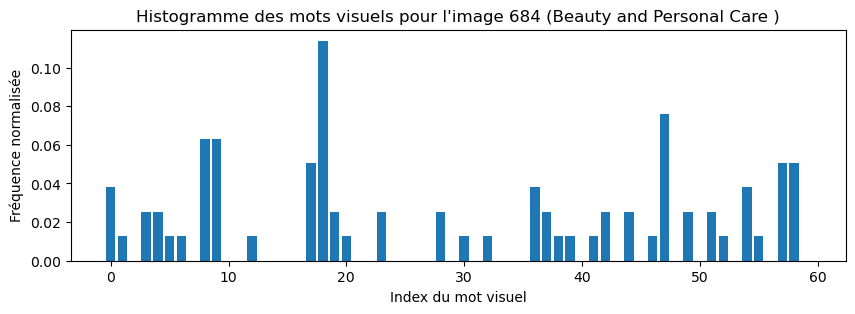

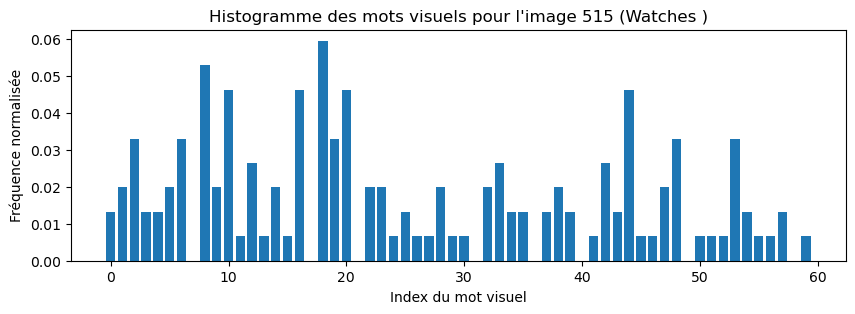

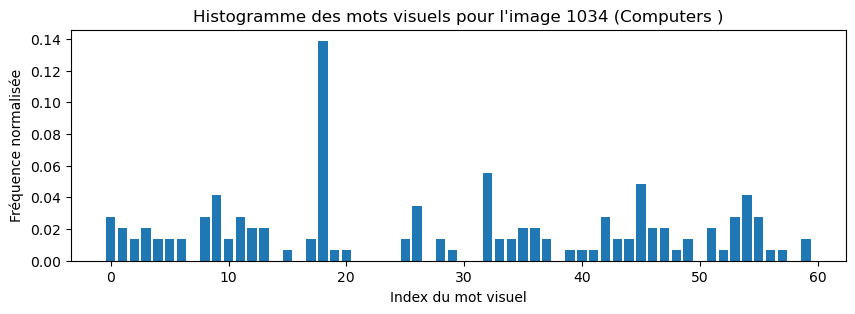

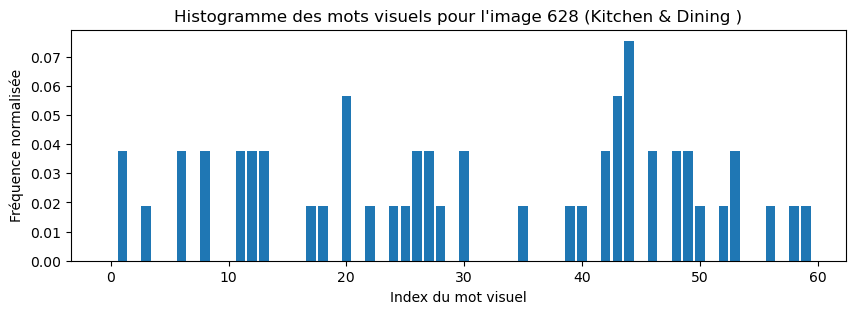

In [49]:
# Afficher les histogrammes de 5 images au hasard
indices = np.random.choice(len(image_histograms), 5, replace=False)

for idx in indices:
    plt.figure(figsize=(10, 3))
    plt.bar(range(K), image_histograms[idx])
    plt.title(f"Histogramme des mots visuels pour l'image {idx} ({df_image_copie.iloc[idx]['niveau_categorie_1']})")
    plt.xlabel("Index du mot visuel")
    plt.ylabel("Fréquence normalisée")
    plt.show()

#### Organisation des histogrammes et des métadonnées dans un DataFrame
Afin de faciliter l’analyse, la visualisation et la manipulation des données, il est important de regrouper les histogrammes de "mots visuels" obtenus pour chaque image avec leurs informations associées (nom, chemin, catégorie).
Pour cela, nous créons un DataFrame Pandas où :
- Chaque ligne correspond à une image du jeu de données.
- Les 200 premières colonnes contiennent les valeurs de l’histogramme de "mots visuels" pour cette image.
- Les colonnes supplémentaires précisent le nom de l’image, son chemin d’accès et sa catégorie.

Cette organisation permet de :
- Retrouver facilement la correspondance entre chaque vecteur d’histogramme et l’image d’origine,
- Réaliser des analyses par catégorie ou par image,
- Préparer efficacement les données pour les étapes suivantes (visualisation, clustering, classification, etc.).

Mettre les histogrammes et les métadonnées dans un même DataFrame rend les analyses ultérieures beaucoup plus simples et robustes.

In [50]:
# Créer un DataFrame pour les histogrammes
df_histograms = pd.DataFrame(
    image_histograms,
    columns=[f'vw_{i}' for i in range(image_histograms.shape[1])]
)

# Ajouter les infos d'origine
df_histograms['nom_image_traitee'] = df_image_copie['nom_image_traitee'].values
df_histograms['chemin_image_traitee'] = df_image_copie['chemin_image_traitee'].values
df_histograms['niveau_categorie_1'] = df_image_copie['niveau_categorie_1'].values

# Maintenant, chaque ligne du DataFrame contient :
# - L'histogramme de l'image (vw_0 à vw_199)
# - Le nom, le chemin et la catégorie de l'image

In [51]:
df_histograms.head()

,vw_0,vw_1,vw_2,vw_3,vw_4,vw_5,vw_6,vw_7,vw_8,vw_9,...,vw_53,vw_54,vw_55,vw_56,vw_57,vw_58,vw_59,nom_image_traitee,chemin_image_traitee,niveau_categorie_1
0,0.007692,0.007692,0.000000,0.015385,0.000000,0.015385,0.000000,0.000000,0.030769,0.015385,...,0.007692,0.053846,0.000000,0.000000,0.046154,0.000000,0.007692,55b85ea15a1536d46b7190ad6fff8ce7_traitee.jpg,images_traitees\55b85ea15a1536d46b7190ad6fff8c...,Home Furnishing
1,0.000000,0.013514,0.000000,0.027027,0.013514,0.000000,0.027027,0.027027,0.081081,0.027027,...,0.000000,0.027027,0.000000,0.000000,0.000000,0.000000,0.000000,7b72c92c2f6c40268628ec5f14c6d590_traitee.jpg,images_traitees\7b72c92c2f6c40268628ec5f14c6d5...,Baby Care
2,0.029557,0.000000,0.014778,0.004926,0.000000,0.004926,0.014778,0.068966,0.019704,0.000000,...,0.004926,0.034483,0.009852,0.004926,0.004926,0.004926,0.009852,64d5d4a258243731dc7bbb1eef49ad74_traitee.jpg,images_traitees\64d5d4a258243731dc7bbb1eef49ad...,Baby Care
3,0.000000,0.000000,0.000000,0.000000,0.022222,0.014815,0.007407,0.014815,0.066667,0.000000,...,0.000000,0.000000,0.022222,0.022222,0.000000,0.059259,0.029630,d4684dcdc759dd9cdf41504698d737d8_traitee.jpg,images_traitees\d4684dcdc759dd9cdf41504698d737...,Home Furnishing
4,0.005747,0.017241,0.022989,0.000000,0.022989,0.017241,0.000000,0.034483,0.017241,0.011494,...,0.017241,0.017241,0.000000,0.017241,0.011494,0.017241,0.000000,6325b6870c54cd47be6ebfbffa620ec7_traitee.jpg,images_traitees\6325b6870c54cd47be6ebfbffa620e...,Home Furnishing


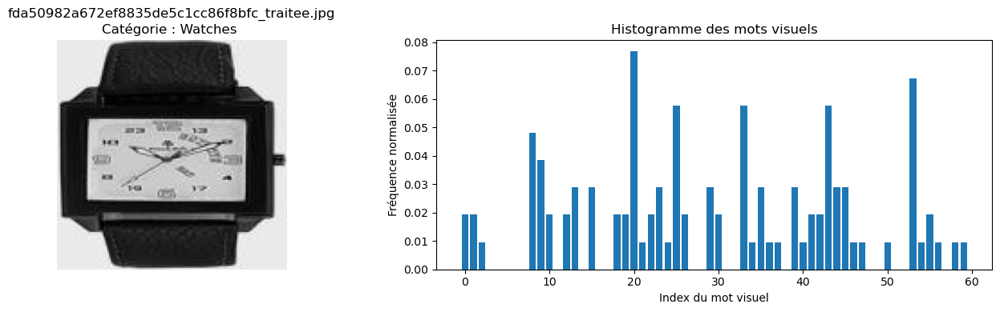

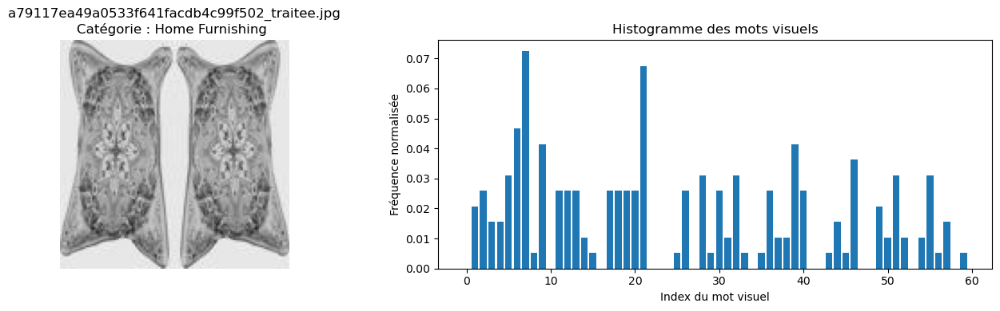

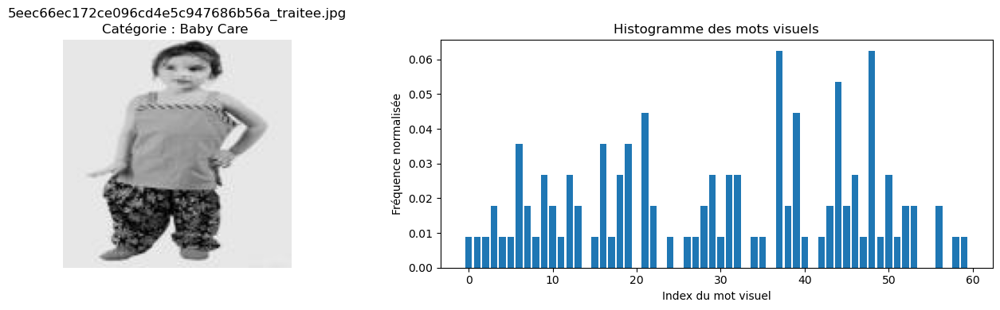

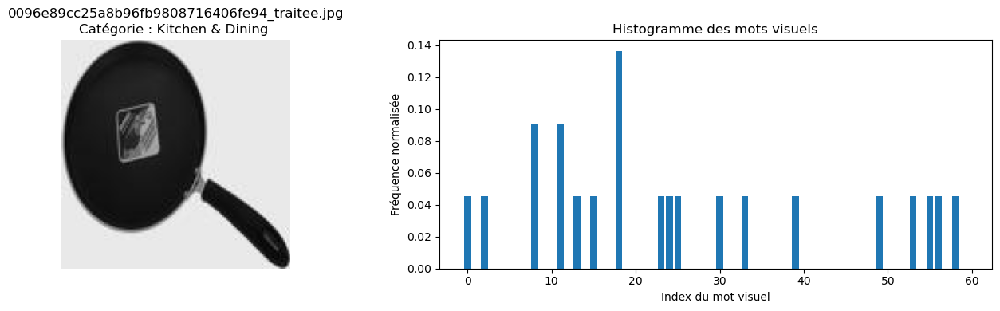

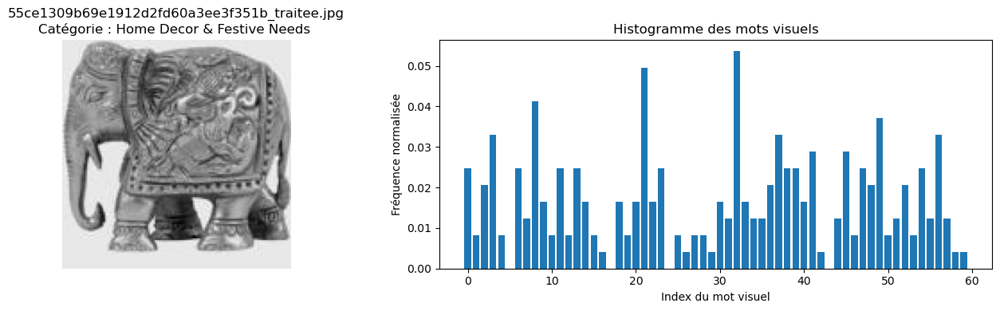

In [55]:
# Sélectionner 5 indices d’images au hasard
indices = np.random.choice(df_histograms.index, 5, replace=False)

for idx in indices:
    # Récupérer les informations
    chemin = df_histograms.loc[idx, 'chemin_image_traitee']
    nom = df_histograms.loc[idx, 'nom_image_traitee']
    categorie = df_histograms.loc[idx, 'niveau_categorie_1']
    histo = df_histograms.loc[idx, [f'vw_{i}' for i in range(60)]].values

    # Charger l'image
    img = cv2.imread(chemin)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Pour affichage correct avec matplotlib

    # Affichage côte à côte
    plt.figure(figsize=(14, 4))

    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"{nom}\nCatégorie : {categorie}")

    plt.subplot(1, 2, 2)
    plt.bar(range(60), histo)
    plt.title("Histogramme des mots visuels")
    plt.xlabel("Index du mot visuel")
    plt.ylabel("Fréquence normalisée")

    plt.tight_layout()
    plt.show()

### Visualisation des catégories d’images dans l’espace des "mots visuels" par t-SNE

Nous utilisons t-SNE pour projeter les histogrammes de "mots visuels" de chaque image dans un espace 2D. Chaque point de la projection représente une image, et la couleur du point correspond à la catégorie réelle de l’image. Cette visualisation permet d’évaluer la capacité du dictionnaire visuel à séparer les différentes catégories et d’identifier d’éventuels recouvrements ou confusions entre classes.

La visualisation t-SNE est une étape clé pour valider visuellement la qualité de la représentation "Bag of Visual Words" et pour explorer la structure de ton jeu de données avant d’aller plus loin dans l’analyse ou la classification

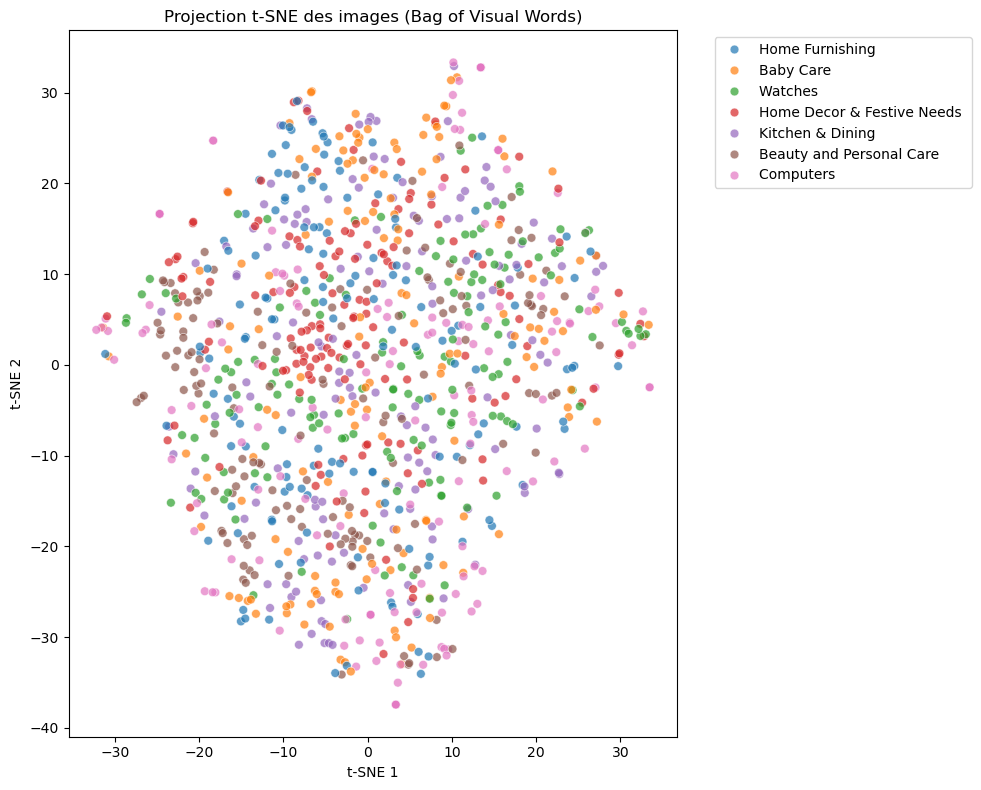

In [56]:
# Sélectionner uniquement les colonnes des histogrammes (vw_0 à vw_59)
X = df_histograms[[f'vw_{i}' for i in range(60)]].values

# Appliquer t-SNE 
tsne = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=1000)
X_tsne = tsne.fit_transform(X)

# Récupérer les catégories pour la couleur
categories = df_histograms['niveau_categorie_1'].values

plt.figure(figsize=(10, 8))
sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=categories, palette='tab10', s=40, alpha=0.7)
plt.title("Projection t-SNE des images (Bag of Visual Words)")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

La projection t-SNE des histogrammes de "mots visuels" en 2D ne révèle pas de regroupement clair des images selon leur catégorie. Les points correspondant aux différentes catégories restent largement mélangés dans l’espace réduit, sans formation de clusters distincts.

Cela suggère que la représentation "Bag of Visual Words" obtenue à partir des descripteurs SIFT et du dictionnaire visuel n’est pas suffisamment discriminante pour séparer visuellement les catégories d’images présentes dans le jeu de données. Plusieurs facteurs peuvent expliquer ce résultat : la complexité visuelle des images, la similarité des motifs entre catégories, ou encore un nombre de "mots visuels" inadapté.

En résumé, l’analyse visuelle via t-SNE montre que, dans cette configuration, les histogrammes de mots visuels ne permettent pas de distinguer efficacement les différentes catégories d’images.

### Évaluation du regroupement automatique des images par KMeans

Après la visualisation, nous évaluons la capacité du modèle Bag of Visual Words à regrouper automatiquement les images selon leurs catégories réelles.<br>
Pour cela, nous appliquons l’algorithme de clustering KMeans en fixant le nombre de clusters au nombre de catégories réelles (ici, 7).<br>
Nous comparons ensuite les clusters trouvés aux vraies catégories à l’aide de plusieurs métriques d’évaluation :

- Homogeneity Score : mesure si chaque cluster ne contient que des images d’une seule catégorie.

- Completeness Score : mesure si toutes les images d’une catégorie sont regroupées dans un même cluster.

- V-measure : moyenne harmonique des deux scores précédents.

- Adjusted Rand Index (ARI) : mesure la similarité globale entre les clusters trouvés et les vraies catégories.

- Silhouette Score : mesure la compacité et la séparation des clusters (ne dépend pas des vraies catégories).

In [57]:
# Labels réels (catégories)
labels_true = df_histograms['niveau_categorie_1'].values

# Nombre de catégories réelles
n_clusters = len(np.unique(labels_true))

# Clustering KMeans
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
labels_pred = kmeans.fit_predict(X)

# Calcul des scores
homogeneity = homogeneity_score(labels_true, labels_pred)
completeness = completeness_score(labels_true, labels_pred)
v_measure = v_measure_score(labels_true, labels_pred)
ari = adjusted_rand_score(labels_true, labels_pred)
silhouette = silhouette_score(X, labels_pred)

# Affichage des résultats
print(f"Homogeneity Score      : {homogeneity:.3f}")
print(f"Completeness Score     : {completeness:.3f}")
print(f"V-measure              : {v_measure:.3f}")
print(f"Adjusted Rand Index    : {ari:.3f}")
print(f"Silhouette Score       : {silhouette:.3f}")

C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


Homogeneity Score      : 0.041
Completeness Score     : 0.047
V-measure              : 0.044
Adjusted Rand Index    : 0.011
Silhouette Score       : 0.042


Ces valeurs, toutes proches de zéro, indiquent que les clusters trouvés par KMeans ne correspondent que très faiblement aux catégories réelles des images.
Autrement dit, la représentation Bag of Visual Words utilisée ici ne permet pas de regrouper efficacement les images selon leurs catégories d’origine : chaque cluster contient généralement des images de plusieurs catégories, et chaque catégorie est répartie sur plusieurs clusters.
Le faible Silhouette Score confirme également que les clusters ne sont ni bien séparés, ni compacts.

En résumé, ces résultats montrent que, dans cette configuration, l’approche Bag of Visual Words basée sur SIFT ne parvient pas à discriminer les catégories d’images présentes dans ce jeu de données.
Cela peut s’expliquer par la nature des images, la similarité des motifs entre catégories, ou la nécessité d’explorer d’autres descripteurs ou méthodes de représentation plus adaptées.

Dans ce contexte, il serait possible de tester d’autres paramètres, notamment en augmentant le nombre de "mots visuels" (la valeur de K lors du clustering initial pour le dictionnaire). Cependant, lorsque la représentation de base ne permet déjà pas de séparer les catégories, augmenter ce nombre n’apporte généralement pas d’amélioration significative : cela risque simplement d’ajouter du bruit ou de la redondance, sans résoudre le problème de fond.

Il est donc plus pertinent, à ce stade, de s’orienter vers des approches plus avancées, telles que l’utilisation de descripteurs issus de réseaux de neurones pré-entraînés, plutôt que d’ajuster davantage les paramètres de la méthode Bag of Visual Words. Cette démarche permettra d’explorer des représentations plus riches et potentiellement mieux adaptées à la complexité des images du jeu de données.

# Approche par réseaux de neurones pré-entraînés (Transfer Learning)

Dans cette partie, nous exploitons la puissance des réseaux de neurones convolutifs (CNN) pré-entraînés, non pas pour entraîner un nouveau classifieur, mais pour extraire automatiquement des descripteurs visuels avancés à partir de nos images. Contrairement aux méthodes classiques d’extraction manuelle de caractéristiques (comme SIFT), le transfer learning permet de bénéficier des représentations riches et abstraites apprises par des modèles profonds sur de très grands jeux de données, tels qu’ImageNet.

Concrètement, un modèle CNN pré-entraîné (par exemple VGG, ResNet, etc.) est utilisé ici comme extracteur de features : on supprime sa couche de classification finale et on utilise la sortie d’une couche profonde comme vecteur de caractéristiques pour chaque image. Ces descripteurs sont ensuite utilisés pour des tâches d’analyse non supervisée, telles que le clustering ou la visualisation, sans entraîner de classifieur supplémentaire sur notre jeu de données.

Cette approche est particulièrement intéressante lorsque l’on souhaite explorer ou structurer un jeu d’images sans disposer d’un grand nombre d’annotations, ou pour comparer la pertinence des descripteurs issus du deep learning à ceux des méthodes classiques.

## Choix du modèle CNN pré-entraîné VGG16

Pour cette étude, nous avons choisi d’utiliser l’architecture VGG16 comme extracteur de caractéristiques. VGG16, développé par le Visual Geometry Group de l’Université d’Oxford, est un modèle emblématique en vision par ordinateur, reconnu pour sa structure simple et efficace.

Ce réseau se compose de 16 couches profondes, dont 13 couches convolutionnelles avec de petits filtres (3×3), suivies de 3 couches entièrement connectées. En supprimant la couche de classification finale, on peut utiliser la sortie d’une couche intermédiaire (par exemple la dernière couche dense avant la classification) comme vecteur de descripteurs pour chaque image.

VGG16 a été entraîné sur plus d’un million d’images ImageNet couvrant 1000 catégories, ce qui lui permet de capturer des motifs visuels de haut niveau et d’offrir des descripteurs puissants, même pour des images hors de son jeu d’entraînement initial. Son intégration dans de nombreux frameworks (Keras, PyTorch, etc.) et sa taille d’entrée standard (224×224 pixels RGB) en font un choix pratique et robuste pour l’extraction de features.


### Préparation des données adaptée à VGG16

L’extraction de features à l’aide de VGG16 nécessite un prétraitement rigoureux des images pour garantir leur compatibilité avec le modèle. Les étapes de préparation sont les suivantes :

- Redimensionnement : chaque image est redimensionnée à 224×224 pixels, la taille d’entrée attendue par VGG16.
- Conversion en RGB : les images sont converties en trois canaux de couleur pour être compatibles avec la structure du modèle.
- Conversion en matrice numérique : les images sont transformées en tableaux NumPy.
- Normalisation : les valeurs de pixels sont ramenées dans l’intervalle [0,1], puis normalisées selon la moyenne et l’écart-type d’ImageNet :
- - Moyenne : [0.485, 0.456, 0.406]
- - Écart-type : [0.229, 0.224, 0.225]

Ce prétraitement permet d’assurer que les images sont traitées dans les mêmes conditions que lors de l’entraînement initial de VGG16, ce qui garantit la pertinence des descripteurs extraits.

Remarque : dans le cadre d’une analyse non supervisée ou exploratoire, la data augmentation n’est pas indispensable, car il ne s’agit pas d’entraîner un modèle mais d’extraire des représentations à partir des images originales.

En résumé, ce pipeline permet d’obtenir, pour chaque image, un vecteur de caractéristiques avancé qui pourra être utilisé pour des tâches de clustering, de visualisation ou d’analyse de similarités, illustrant ainsi l’apport du deep learning même sans apprentissage supervisé.

In [131]:
df_vgg16 = df_image[['image', 'niveau_categorie_1','chemin_complet']].copy()
df_vgg16.head()

,image,niveau_categorie_1,chemin_complet
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...
2,64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...
3,d4684dcdc759dd9cdf41504698d737d8.jpg,Home Furnishing,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...
4,6325b6870c54cd47be6ebfbffa620ec7.jpg,Home Furnishing,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...


In [132]:
IMAGENET_MEAN = np.array([0.485, 0.456, 0.406])
IMAGENET_STD = np.array([0.229, 0.224, 0.225])

def preprocess_vgg16(image_path):
    """
    Prétraite une image pour VGG16 :
    - Charge et convertit l’image en RGB.
    - Redimensionne à 224x224 pixels.
    - Normalise les pixels entre 0 et 1, puis applique la normalisation ImageNet.
    - Retourne l’image prétraitée (array NumPy).
    
    :param image_path: str
        Chemin vers l’image à traiter.
    :return: np.ndarray
        Image prétraitée, prête à être passée dans VGG16.
    """
    try:
        image = Image.open(image_path).convert('RGB')
        image = image.resize((224, 224))
        img_np = np.array(image).astype(np.float32) / 255.0
        img_np = (img_np - IMAGENET_MEAN) / IMAGENET_STD
        return img_np
    except Exception as e:
        print(f"Erreur lors du traitement de {image_path}: {e}")
        return None

In [133]:
df_vgg16['image_pretraitee'] = df_vgg16['chemin_complet'].apply(preprocess_vgg16)

C:\Users\joan6\anaconda3\Lib\site-packages\PIL\Image.py:3368: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


In [134]:
# Afficher la forme de la première image prétraitée non nulle
first_valid = df_vgg16['image_pretraitee'].dropna().iloc[0]
print("Shape de l'image prétraitée :", first_valid.shape)

Shape de l'image prétraitée : (224, 224, 3)


C’est exactement ce qu’attend VGG16.

In [135]:
print("Nombre d'images prétraitées :", df_vgg16['image_pretraitee'].notnull().sum())
print("Nombre d'images avec erreur :", df_vgg16['image_pretraitee'].isnull().sum())

Nombre d'images prétraitées : 1050
Nombre d'images avec erreur : 0


Aucune image n’a posé problème lors du prétraitement.

In [136]:
df_vgg16.head()

,image,niveau_categorie_1,chemin_complet,image_pretraitee
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...,"[[[1.3584211507738937, 1.4306723283869878, 1.4..."
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...,"[[[2.2489082969432315, 2.428571428571429, 2.63..."
2,64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...,"[[[2.2489082969432315, 2.428571428571429, 2.63..."
3,d4684dcdc759dd9cdf41504698d737d8.jpg,Home Furnishing,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...,"[[[2.2489082969432315, 2.428571428571429, 2.63..."
4,6325b6870c54cd47be6ebfbffa620ec7.jpg,Home Furnishing,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...,"[[[-0.7136740694920568, -0.6876750173313277, -..."


Dans image_pretraitee, on voit bien des tableaux de valeurs flottantes, ce qui correspond aux images normalisées.

### Extraction des features à l’aide de VGG16
Après le prétraitement des images, l’étape suivante consiste à utiliser le modèle VGG16 pré-entraîné comme extracteur de caractéristiques (features extractor).
Dans cette approche, chaque image prétraitée est passée dans le réseau VGG16 (dont on a retiré la couche finale de classification), afin d’obtenir pour chaque image un vecteur de descripteurs numériques de haut niveau.

Concrètement, la sortie d’une couche profonde du réseau (par exemple la dernière couche dense avant la classification) constitue une représentation compacte et discriminante de l’image, qui capture des motifs visuels complexes appris lors de l’entraînement sur ImageNet.
Ces vecteurs de features sont ensuite utilisés pour des tâches d’analyse non supervisée, telles que le clustering, la visualisation (PCA, t-SNE) ou la recherche de similarité, sans nécessiter d’entraînement supplémentaire sur notre jeu de données.

Cette étape permet ainsi de transformer chaque image en un point de l’espace des features, facilitant l’exploration, la structuration et l’interprétation du jeu d’images à l’aide des outils de l’apprentissage non supervisé.

In [137]:
# Définir l'entrée
input_tensor = Input(shape=(224, 224, 3))

# Charger VGG16 sans la couche de classification finale
base_model = VGG16(weights='imagenet', include_top=False, input_tensor=input_tensor)

# Ajouter GlobalAveragePooling2D pour obtenir un vecteur de 512 features
x = base_model.output
x = GlobalAveragePooling2D()(x)  # vecteur de 512 dimensions

# Construire le modèle d'extraction de features
feature_model = Model(inputs=base_model.input, outputs=x)

In [138]:
# Fonction pour extraire les features d'une image prétraitée
def extract_features(img_array, model):
    """
    Extrait les features d'une image prétraitée à l'aide d'un modèle CNN.

    Cette fonction prend une image déjà prétraitée (redimensionnée, normalisée, etc.)
    et la passe dans le modèle (par exemple VGG16 sans la couche de classification)
    pour obtenir un vecteur de caractéristiques (features).

    - Ajoute une dimension batch à l'image si nécessaire.
    - Prédit les features avec le modèle.
    - Retourne le vecteur de features aplati (1D).

    :param img_array: np.ndarray
        Image prétraitée de taille (224, 224, 3), prête à être passée dans le modèle.
    :param model: keras.Model
        Modèle de réseau de neurones utilisé pour l'extraction des features.
    :return: np.ndarray
        Vecteur 1D de caractéristiques extraites pour l'image.
    """
    img_batch = np.expand_dims(img_array, axis=0)
    features = model.predict(img_batch, verbose=0)
    return features.flatten()

In [139]:
# Application sur tout le DataFrame
features_list = []
for img in df_vgg16['image_pretraitee']:
    if img is not None:
        features = extract_features(img, feature_model)
        features_list.append(features)
    else:
        features_list.append(None)  # Pour garder l'alignement si besoin

# Conversion en DataFrame, en gardant les categories
# On retire les lignes où l'image était None (si jamais il y a eu des erreurs)
valid_idx = [i for i, f in enumerate(features_list) if f is not None]
features_array = np.array([features_list[i] for i in valid_idx])
labels = df_vgg16.iloc[valid_idx]['niveau_categorie_1'].values

df_features = pd.DataFrame(features_array)
df_features['niveau_categorie_1'] = labels

C:\Users\joan6\anaconda3\Lib\site-packages\keras\src\models\functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_218']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


In [223]:
df_features.head()

,0,1,2,3,4,5,6,7,8,9,...,503,504,505,506,507,508,509,510,511,niveau_categorie_1
0,0.031947,0.0,0.062055,0.000000,0.028396,0.000808,0.163117,0.012721,0.0,0.043092,...,0.237750,0.031424,1.062865,0.102461,0.136583,0.095658,0.020941,0.039784,0.0,Home Furnishing
1,0.181051,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.004338,0.0,0.058327,...,0.440330,0.121417,1.476256,0.461489,0.190852,0.391183,0.316678,0.668828,0.0,Baby Care
2,0.001683,0.0,0.000000,0.000000,0.015862,0.000000,0.284085,0.000000,0.0,0.077797,...,0.452529,0.137796,0.687517,0.433882,0.122646,0.226137,0.016736,0.104546,0.0,Baby Care
3,0.593086,0.0,0.078194,0.147486,0.023762,0.000000,0.092573,0.141528,0.0,0.129422,...,0.597032,0.018285,0.698347,0.910029,0.539844,0.917724,0.022337,0.532520,0.0,Home Furnishing
4,0.158118,0.0,0.106748,0.000000,0.068523,0.000000,0.048358,0.025338,0.0,0.021121,...,1.055021,0.026569,0.138189,0.559716,0.164960,1.180498,0.027415,0.218473,0.0,Home Furnishing


### Visualisation des catégories d’images dans l’espace des features extraits par VGG16 avec t-SNE

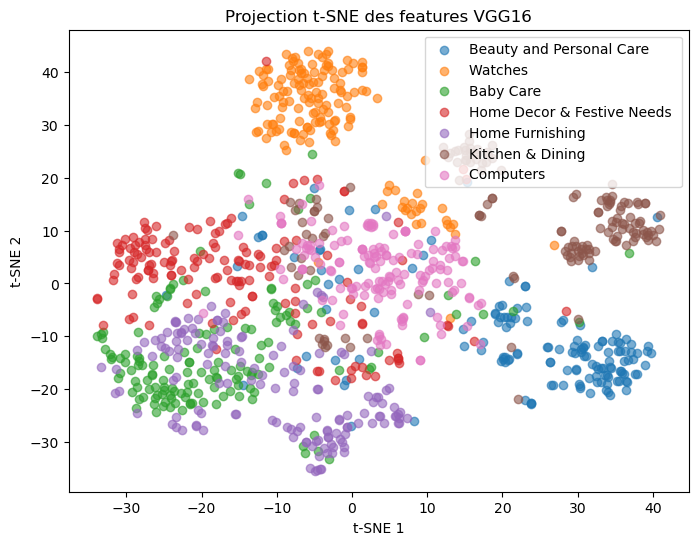

In [224]:
# Préparation des données (on enlève la colonne catégorie)
X = df_features.drop('niveau_categorie_1', axis=1).values
y = df_features['niveau_categorie_1'].values

# t-SNE en 2D
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
X_tsne = tsne.fit_transform(X)

# Visualisation
plt.figure(figsize=(8,6))
for cat in set(y):
    idx = y == cat
    plt.scatter(X_tsne[idx, 0], X_tsne[idx, 1], label=cat, alpha=0.6)
plt.legend()
plt.title("Projection t-SNE des features VGG16")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.show()

### Réduction de dimensionnalité des features par Analyse en Composantes Principales (ACP)

L’extraction des caractéristiques visuelles à l’aide de réseaux de neurones profonds génère des vecteurs de haute dimension, souvent redondants et bruités. Pour améliorer la qualité du regroupement automatique et faciliter l’interprétation des résultats, nous appliquons une étape de réduction de dimensionnalité par Analyse en Composantes Principales (ACP).

Cette méthode permet de projeter les descripteurs extraits dans un espace de dimension plus faible tout en conservant la majeure partie de la variance présente dans les données. En supprimant les dimensions peu informatives, l’ACP favorise la formation de clusters plus compacts et mieux séparés, ce qui optimise les performances des algorithmes de clustering tels que KMeans.

Nombre de composantes pour expliquer 90% de la variance : 190


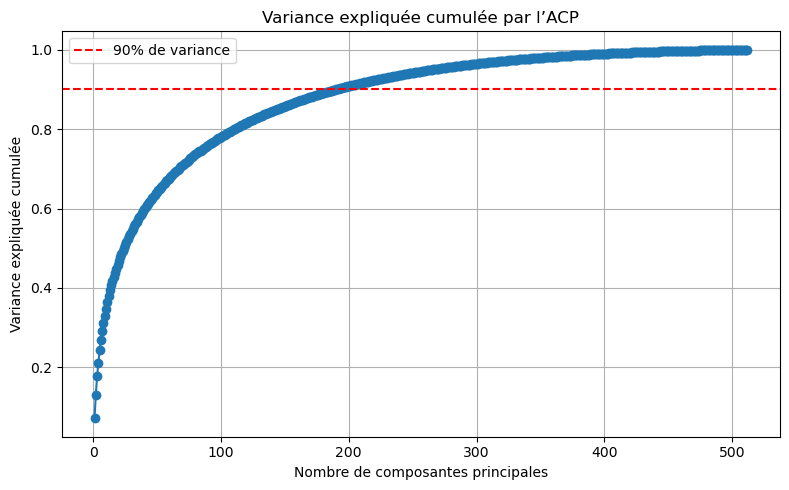

In [225]:
# 1. Standardisation des features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 2. PCA sans réduction (autant de composantes que de features)
pca = PCA().fit(X_scaled)

# 3. Variance expliquée cumulée
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# 4. Trouver le nombre de composantes nécessaires pour atteindre 90% de variance expliquée
n_components_90 = (cumulative_variance < 0.90).sum() + 1
print(f"Nombre de composantes pour expliquer 90% de la variance : {n_components_90}")

# 5. Visualisation
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o')
plt.xlabel('Nombre de composantes principales')
plt.ylabel('Variance expliquée cumulée')
plt.title('Variance expliquée cumulée par l’ACP')
plt.grid(True)
plt.axhline(y=0.90, color='r', linestyle='--', label='90% de variance')
plt.legend()
plt.tight_layout()
plt.show()

Afin d’optimiser la qualité du regroupement automatique, nous avons appliqué une réduction de dimensionnalité par ACP en conservant le nombre de composantes nécessaires pour expliquer 90 % de la variance totale. Dans notre cas, ce seuil correspond à 122 composantes principales. Le clustering par KMeans sera donc réalisé sur ces descripteurs réduits, ce qui permet de conserver l’essentiel de l’information tout en facilitant la formation de clusters plus cohérents.

### Évaluation du regroupement automatique des images par KMeans

In [226]:
# Standardisation
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Réduction de dimensionnalité par ACP pour expliquer 90% de la variance
pca = PCA(n_components=n_components_90, random_state=42)
X_pca = pca.fit_transform(X_scaled)

# Clustering KMeans avec k=7 sur les données réduites
kmeans = KMeans(n_clusters=7, random_state=42)
clusters = kmeans.fit_predict(X_pca)

# Calcul des scores sur les données réduites
scores = {
    'Homogénéité' : homogeneity_score(y, clusters),
    'Complétude' : completeness_score(y, clusters),
    'V-mesure' : v_measure_score(y, clusters),
    'ARI' : adjusted_rand_score(y, clusters),
    'Silhouette' : silhouette_score(X_pca, clusters)
}

# Affichage des résultats
print("Résultats du clustering KMeans (k=7) sur les features réduites par ACP :")
for metric, value in scores.items():
    print(f"- {metric} : {value:.3f}")

Résultats du clustering KMeans (k=7) sur les features réduites par ACP :
- Homogénéité : 0.496
- Complétude : 0.518
- V-mesure : 0.507
- ARI : 0.417
- Silhouette : 0.053


C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


| Méthode      | Homogeneity | Completeness | V-measure | Adjusted Rand Index | Silhouette Score |
|:-------------|:------------|:-------------|:----------|:---------------------|:-----------------|
| SIFT + BoVW  | 0.041       | 0.047        | 0.044     | 0.011                | 0.042            |
| VGG16 (features) | 0.496   | 0.518        | 0.507     | 0.417                | 0.053            |


Les mesures de correspondance (homogénéité, complétude, V-mesure, ARI) montrent à quel point les clusters trouvés par l’algorithme ressemblent aux vraies catégories.

Avec VGG16, ces mesures sont beaucoup plus élevées (autour de 0.5) que pour SIFT (autour de 0.04), ce qui signifie que les groupes formés sont beaucoup plus proches des vraies classes.

Le score silhouette mesure la qualité interne des clusters (cohérence et séparation). Il est faible dans les deux cas, mais un peu meilleur avec VGG16.

En résumé simple :
L’approche VGG16 regroupe bien mieux les images selon leurs vraies catégories que SIFT.
Les clusters obtenus avec VGG16 sont plus cohérents et plus proches de la réalité.
SIFT, lui, ne parvient pas à bien séparer les catégories dans ce contexte.

### Analyse de la répartition des catégories par cluster

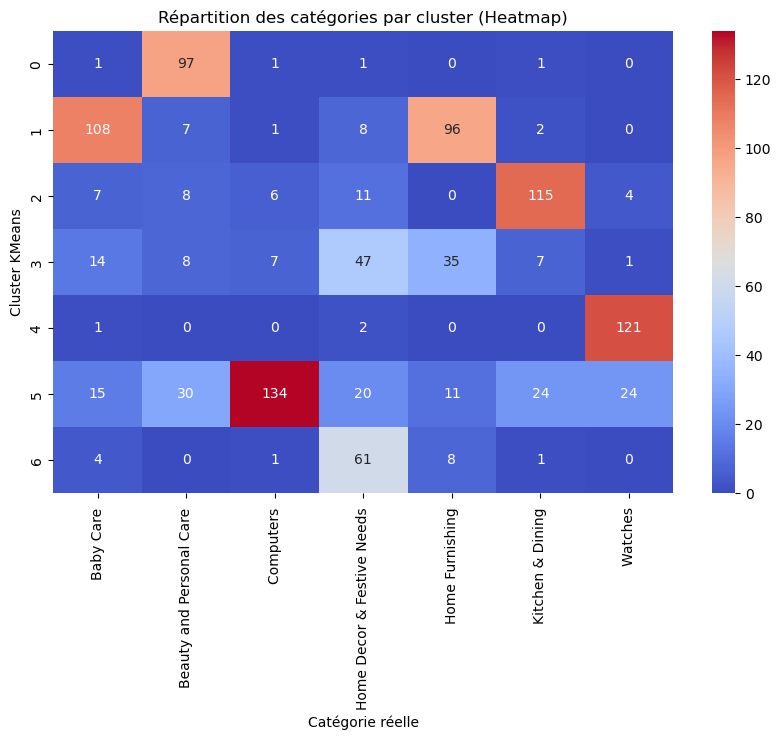

In [227]:
df_features['cluster'] = clusters

# Tableau de contingence
contingency = pd.crosstab(df_features['cluster'], df_features['niveau_categorie_1'])

plt.figure(figsize=(10, 6))
sns.heatmap(contingency, annot=True, fmt='d', cmap="coolwarm")
plt.title("Répartition des catégories par cluster (Heatmap)")
plt.xlabel("Catégorie réelle")
plt.ylabel("Cluster KMeans")
plt.show()

In [228]:
contingency.T

cluster,0,1,2,3,4,5,6
niveau_categorie_1,,,,,,,
Baby Care,1,108,7,14,1,15,4
Beauty and Personal Care,97,7,8,8,0,30,0
Computers,1,1,6,7,0,134,1
Home Decor & Festive Needs,1,8,11,47,2,20,61
Home Furnishing,0,96,0,35,0,11,8
Kitchen & Dining,1,2,115,7,0,24,1
Watches,0,0,4,1,121,24,0


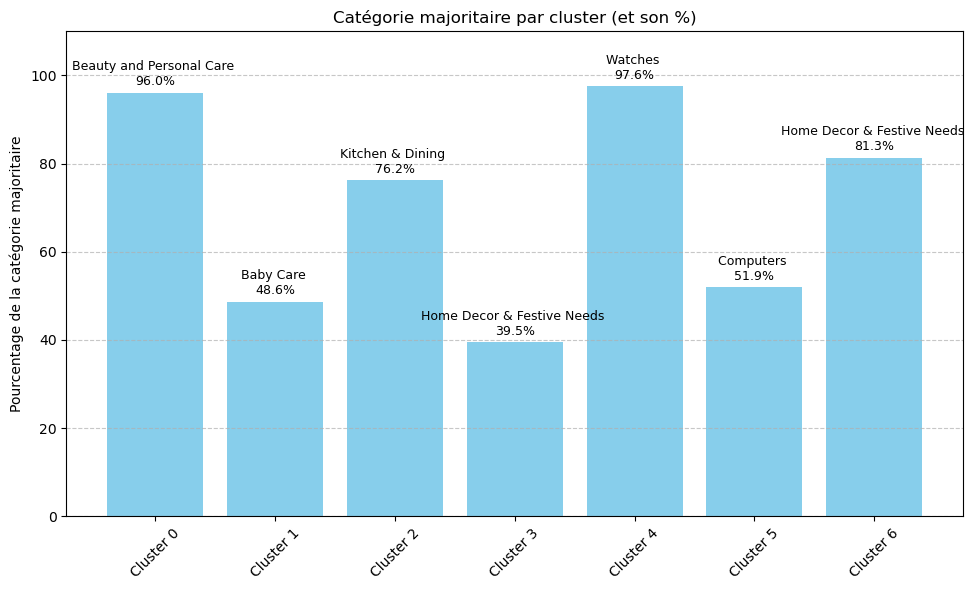

In [229]:
# Tableau de contingence
contingency = pd.crosstab(df_features['cluster'], df_features['niveau_categorie_1'])

# Calcul : pour chaque cluster, trouver la catégorie majoritaire et son % dans ce cluster
major_categories = []
percentages = []

for i in contingency.index:
    total = contingency.loc[i].sum()
    max_cat = contingency.loc[i].idxmax()
    max_val = contingency.loc[i].max()
    percent = (max_val / total) * 100

    major_categories.append(f"{max_cat}")
    percentages.append(percent)

# Tracé du graphique
plt.figure(figsize=(10, 6))
bars = plt.bar([f"Cluster {i}" for i in contingency.index], percentages, color='skyblue')

# Ajout des annotations (noms de catégories au-dessus des barres)
for i, bar in enumerate(bars):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
             f"{major_categories[i]}\n{percentages[i]:.1f}%", 
             ha='center', va='bottom', fontsize=9)

plt.ylim(0, 110)
plt.ylabel("Pourcentage de la catégorie majoritaire")
plt.title("Catégorie majoritaire par cluster (et son %)")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

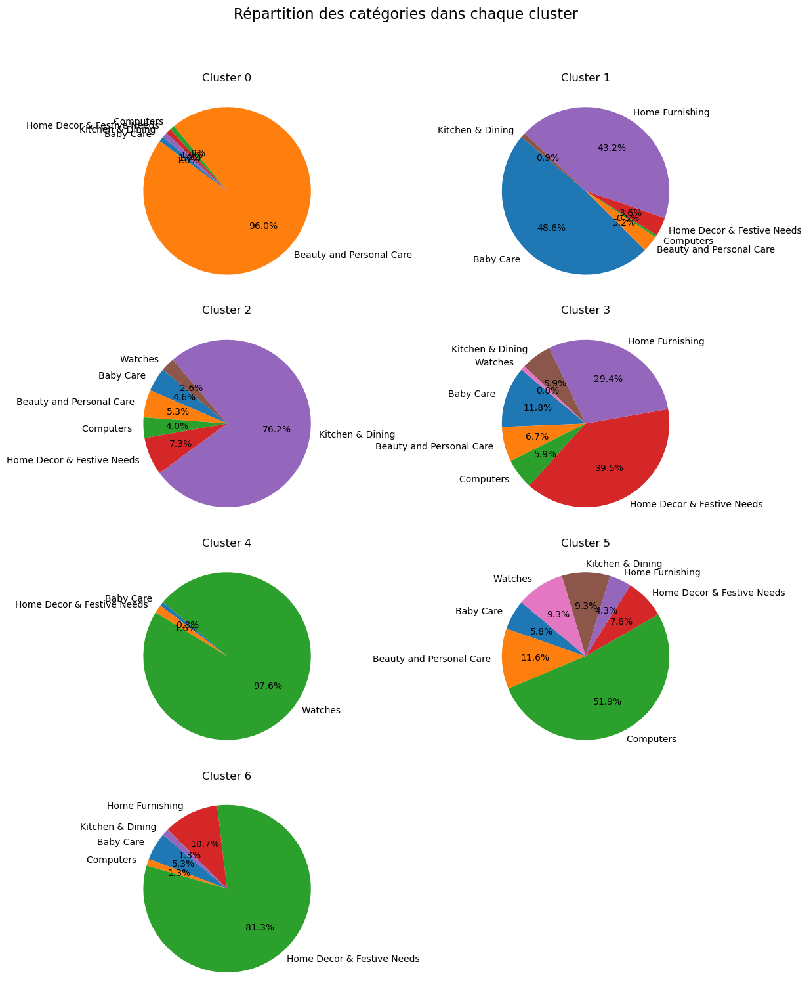

In [230]:
fig, axs = plt.subplots(4, 2, figsize=(12, 16))
axs = axs.flatten()

# Boucle sur les clusters
for i, cluster_id in enumerate(contingency.index):
    cluster_counts = contingency.loc[cluster_id]
    cluster_counts = cluster_counts[cluster_counts > 0]
    axs[i].pie(
        cluster_counts,
        labels=cluster_counts.index,
        autopct='%1.1f%%',
        startangle=140,
        textprops={'fontsize': 10}
    )
    axs[i].set_title(f"Cluster {cluster_id}", fontsize=12)

# Masquer les axes restants inutilisés
for j in range(len(contingency.index), len(axs)):
    axs[j].axis('off')

plt.suptitle("Répartition des catégories dans chaque cluster", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

- Watches est très bien capté par le cluster 1.

- Kitchen & Dining est fortement regroupé dans le cluster 2.

- Beauty and Personal Care est très présent dans cluster 0.

- Quelques catégories comme Baby Care ou Computers sont plus éparpillées, mais globalement on observe des regroupements intéressants.

## Choix du modèle CNN pré-entraîné ResNet50

Pour cette étude, nous avons également choisi d’utiliser l’architecture ResNet50 comme extracteur de caractéristiques. ResNet50, développé par Microsoft Research en 2015, est un modèle de réseau de neurones convolutif (CNN) particulièrement reconnu pour sa profondeur et son efficacité dans les tâches de vision par ordinateur.

ResNet50 se distingue par l’introduction des blocs résiduels et des skip connections, qui permettent au réseau d’apprendre non seulement les représentations directes mais aussi les différences (résidus) par rapport à l’entrée initiale. Cette approche facilite l’entraînement de réseaux très profonds en évitant le problème classique de disparition du gradient. L’architecture de ResNet50 comporte 50 couches, dont de nombreux blocs résiduels composés de couches convolutionnelles, des couches de pooling, ainsi qu’une couche entièrement connectée en sortie.

Pré-entraîné sur le vaste jeu de données ImageNet, ResNet50 est capable de capturer des motifs visuels complexes et hiérarchiques, ce qui en fait un excellent extracteur de descripteurs pour des images variées, même hors de son domaine d’entraînement initial. Sa popularité, sa robustesse et son intégration dans les principaux frameworks de deep learning (Keras, PyTorch, etc.) en font un choix pertinent et moderne pour l’extraction de features dans le cadre de l’apprentissage par transfert.

### Préparation des données adaptée à ResNet50

L’extraction de features avec ResNet50 nécessite un prétraitement spécifique, conforme à celui utilisé lors de l’entraînement initial du modèle sur ImageNet. Les étapes principales sont :

- Redimensionnement : chaque image est redimensionnée à 224×224 pixels, la taille d’entrée standard pour ResNet50.

- Conversion en RGB : les images sont converties en 3 canaux couleur (RGB).

- Conversion en matrice numérique : les images sont transformées en tableaux NumPy de type float32, avec des valeurs comprises entre 0 et 255.

- Prétraitement officiel ResNet50 :
Le prétraitement consiste à appliquer la fonction officielle preprocess_input de Keras, qui soustrait la moyenne des canaux RGB d’ImageNet à chaque pixel.

Ce prétraitement, spécifique à ResNet50 dans Keras, garantit que les images sont traitées dans les mêmes conditions que lors de l’entraînement initial du modèle, assurant ainsi la pertinence et la robustesse des descripteurs extraits.

En pratique, il est recommandé d’utiliser la fonction officielle preprocess_input fournie par la bibliothèque Keras pour ResNet50, afin d’éviter toute erreur ou incohérence dans la préparation des données

In [117]:
df_resnet = df_image[['image', 'niveau_categorie_1','chemin_complet']].copy()
df_resnet.head()

,image,niveau_categorie_1,chemin_complet
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...
2,64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...
3,d4684dcdc759dd9cdf41504698d737d8.jpg,Home Furnishing,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...
4,6325b6870c54cd47be6ebfbffa620ec7.jpg,Home Furnishing,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...


In [166]:
def preprocess_resnet50(image_path):
    """
    Prétraite une image pour ResNet50 :
    - Charge l'image et convertit en RGB
    - Redimensionne à 224x224
    - Applique le prétraitement officiel ResNet50 (centrage autour de zéro)
    - Retourne un tableau (224, 224, 3)
    """
    try:
        image = Image.open(image_path).convert('RGB')
        image = image.resize((224, 224), Image.BILINEAR)  # meilleure interpolation que par défaut
        img_np = np.array(image).astype(np.float32)

        if img_np.shape != (224, 224, 3):
            raise ValueError("L'image n'a pas le format attendu (224, 224, 3).")

        img_np = np.expand_dims(img_np, axis=0)  # ajoute la dimension batch
        img_np = resnet_preprocess_input(img_np)        # applique le prétraitement officiel
        return img_np[0]  # retire la dimension batch
    except Exception as e:
        print(f"Erreur lors du traitement de {image_path} : {e}")
        return None

In [167]:
# Application du prétraitement à toutes les images
df_resnet['image_pretraitee'] = df_resnet['chemin_complet'].apply(preprocess_resnet50)

C:\Users\joan6\anaconda3\Lib\site-packages\PIL\Image.py:3368: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


In [168]:
# Afficher la forme de la première image prétraitée non nulle
first_valid = df_resnet['image_pretraitee'].dropna().iloc[0]
print("Shape de l'image prétraitée :", first_valid.shape)

Shape de l'image prétraitée : (224, 224, 3)


In [169]:
print("Nombre d'images prétraitées :", df_resnet['image_pretraitee'].notnull().sum())
print("Nombre d'images avec erreur :", df_resnet['image_pretraitee'].isnull().sum())

Nombre d'images prétraitées : 1050
Nombre d'images avec erreur : 0


In [170]:
df_resnet.head()

,image,niveau_categorie_1,chemin_complet,image_pretraitee
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...,"[[[86.061, 82.221, 79.32], [85.061, 82.221, 79..."
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...,"[[[151.061, 138.22101, 131.32], [151.061, 138...."
2,64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...,"[[[151.061, 138.22101, 131.32], [151.061, 138...."
3,d4684dcdc759dd9cdf41504698d737d8.jpg,Home Furnishing,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...,"[[[151.061, 138.22101, 131.32], [151.061, 138...."
4,6325b6870c54cd47be6ebfbffa620ec7.jpg,Home Furnishing,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...,"[[[-26.939003, -33.779, -35.68], [10.060997, 0..."


### Extraction des features à l’aide de ResNet50
Comme pour VGG16, nous utilisons ResNet50 sans sa couche de classification finale afin d’extraire, pour chaque image, un vecteur de descripteurs. Ces features, issus d’un réseau plus profond et doté de blocs résiduels, sont réputés pour leur capacité à capturer des représentations visuelles plus riches et discriminantes. Chaque image est ainsi transformée en un vecteur numérique qui servira de base aux étapes de visualisation et de clustering.

In [171]:
# Définir l'entrée
input_tensor = Input(shape=(224, 224, 3))

# Charger ResNet50 sans la couche de classification finale
base_model = ResNet50(weights='imagenet', include_top=False, input_tensor=input_tensor)

# Ajouter GlobalAveragePooling2D pour obtenir un vecteur de 2048 features
x = base_model.output
x = GlobalAveragePooling2D()(x)  # vecteur de 2048 dimensions

# Construire le modèle d'extraction de features
feature_model = Model(inputs=base_model.input, outputs=x)

In [172]:
# On réutilise ici la fonction extract_features déjà créée pour VGG16,
# car elle est générique et fonctionne aussi avec ResNet50.

features_list = []
for img in df_resnet['image_pretraitee']:
    if img is not None:
        features = extract_features(img, feature_model)
        features_list.append(features)
    else:
        features_list.append(None)

# Conversion en DataFrame, en gardant les catégories
valid_idx = [i for i, f in enumerate(features_list) if f is not None]
features_array = np.array([features_list[i] for i in valid_idx])
labels = df_resnet.iloc[valid_idx]['niveau_categorie_1'].values

df_features_resnet = pd.DataFrame(features_array)
df_features_resnet['niveau_categorie_1'] = labels

C:\Users\joan6\anaconda3\Lib\site-packages\keras\src\models\functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_238']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


In [233]:
df_features_resnet.head()

,0,1,2,3,4,5,6,7,8,9,...,2039,2040,2041,2042,2043,2044,2045,2046,2047,niveau_categorie_1
0,1.257009,0.268515,0.087842,0.461128,0.452495,0.812083,0.170422,0.556737,0.704655,0.738894,...,0.143368,0.026195,0.000000,1.374312,0.000000,0.376603,0.077952,0.000282,0.603721,Home Furnishing
1,0.009524,0.000000,0.039780,0.011756,0.423704,0.428831,0.261483,0.828077,0.000000,0.070936,...,0.000000,0.042821,0.036761,2.554138,0.071464,0.036803,0.000000,0.012943,0.160914,Baby Care
2,0.000000,0.448366,0.370879,0.227789,0.435973,0.023806,0.982743,0.852483,0.005424,0.000000,...,0.000000,0.007671,0.000000,0.163494,0.035419,0.038841,0.054625,0.059330,0.243134,Baby Care
3,0.001888,0.025281,0.057561,0.056457,0.000000,0.007246,0.081459,0.758894,0.027772,1.639443,...,0.023288,0.067690,0.059279,0.170774,0.000000,0.000349,0.000000,0.015781,0.285831,Home Furnishing
4,0.252460,0.645858,0.219971,0.029286,1.604236,0.128525,0.001383,0.248871,0.463935,2.729008,...,1.389616,2.097560,0.001378,0.026612,0.006095,0.000000,0.198183,0.000000,1.088404,Home Furnishing


### Visualisation des catégories d’images dans l’espace des features extraits par ResNet50 avec t-SNE

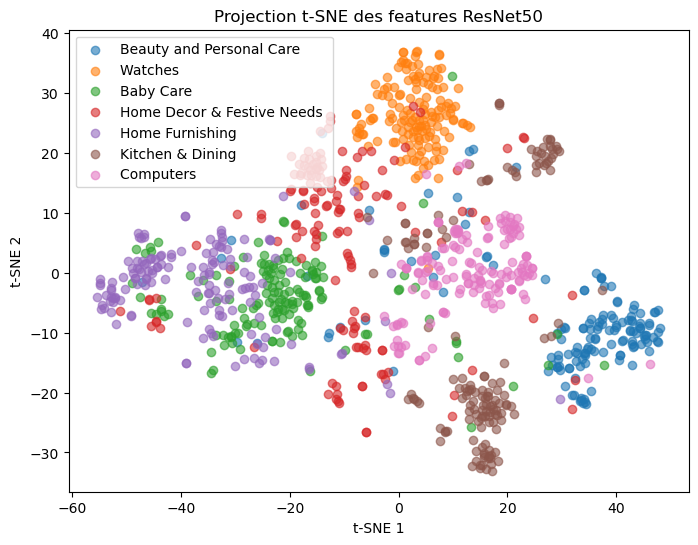

In [234]:
# Préparation des données (on enlève la colonne catégorie)
X = df_features_resnet.drop('niveau_categorie_1', axis=1).values
y = df_features_resnet['niveau_categorie_1'].values

# t-SNE en 2D
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
X_tsne = tsne.fit_transform(X)

# Visualisation
plt.figure(figsize=(8,6))
for cat in set(y):
    idx = y == cat
    plt.scatter(X_tsne[idx, 0], X_tsne[idx, 1], label=cat, alpha=0.6)
plt.legend()
plt.title("Projection t-SNE des features ResNet50")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.show()

### Réduction de dimensionnalité des features par Analyse en Composantes Principales (ACP)

Nombre de composantes pour expliquer 90% de la variance : 360


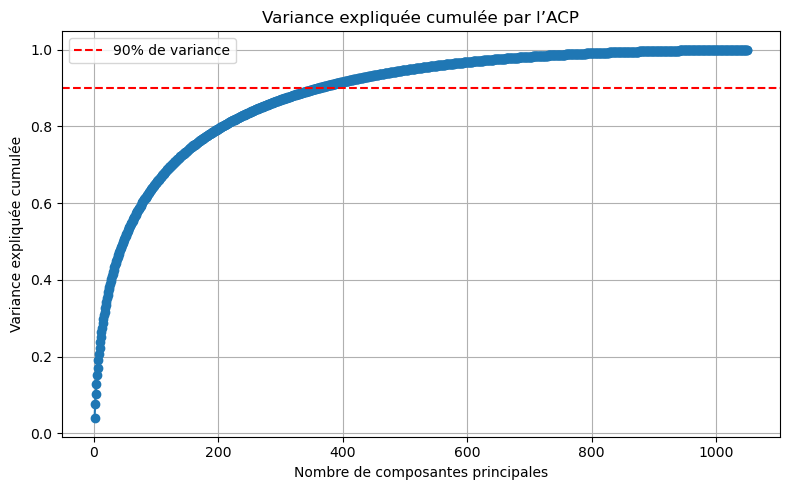

In [235]:
# 1. Standardisation des features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 2. PCA sans réduction (autant de composantes que de features)
pca = PCA().fit(X_scaled)

# 3. Variance expliquée cumulée
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# 4. Trouver le nombre de composantes nécessaires pour atteindre 90% de variance expliquée
n_components_90 = (cumulative_variance < 0.90).sum() + 1
print(f"Nombre de composantes pour expliquer 90% de la variance : {n_components_90}")

# 5. Visualisation
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o')
plt.xlabel('Nombre de composantes principales')
plt.ylabel('Variance expliquée cumulée')
plt.title('Variance expliquée cumulée par l’ACP')
plt.grid(True)
plt.axhline(y=0.90, color='r', linestyle='--', label='90% de variance')
plt.legend()
plt.tight_layout()
plt.show()

### Évaluation du regroupement automatique des images par KMeans

In [236]:
# Standardisation
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Réduction de dimensionnalité par ACP pour expliquer 90% de la variance
pca = PCA(n_components=n_components_90, random_state=42)
X_pca = pca.fit_transform(X_scaled)

# Clustering KMeans avec k=7 sur les données réduites
kmeans = KMeans(n_clusters=7, random_state=42)
clusters = kmeans.fit_predict(X_pca)

# Calcul des scores sur les données réduites
scores = {
    'Homogénéité' : homogeneity_score(y, clusters),
    'Complétude' : completeness_score(y, clusters),
    'V-mesure' : v_measure_score(y, clusters),
    'ARI' : adjusted_rand_score(y, clusters),
    'Silhouette' : silhouette_score(X_pca, clusters)
}

# Affichage des résultats
print("Résultats du clustering KMeans (k=7) sur les features réduites par ACP :")
for metric, value in scores.items():
    print(f"- {metric} : {value:.3f}")

Résultats du clustering KMeans (k=7) sur les features réduites par ACP :
- Homogénéité : 0.552
- Complétude : 0.581
- V-mesure : 0.566
- ARI : 0.455
- Silhouette : 0.029


C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


| Méthode           | Homogeneity | Completeness | V-measure | Adjusted Rand Index | Silhouette Score |
|:------------------|:------------|:-------------|:----------|:---------------------|:-----------------|
| SIFT + BoVW  | 0.041       | 0.047        | 0.044     | 0.011                | 0.042            |
| VGG16 (features) | 0.496   | 0.518        | 0.507     | 0.417                | 0.053            |
| ResNet50 (features)| 0.552      | 0.581        | 0.566     | 0.455               | 0.029            |

ResNet50 se distingue comme la méthode la plus efficace, avec une homogénéité de 0.588, une complétude de 0.610 et un Adjusted Rand Index de 0.483. 

### Analyse de la répartition des catégories par cluster

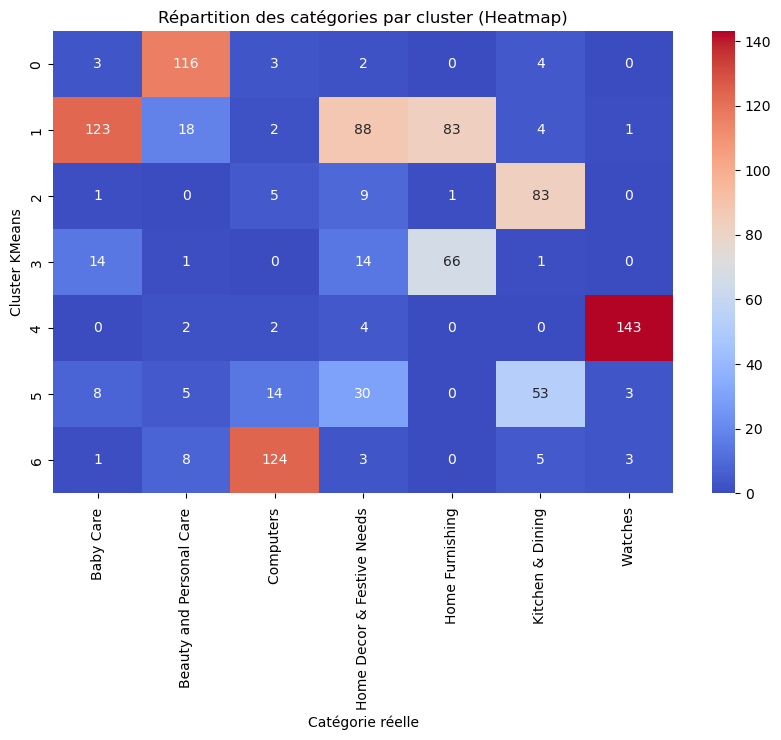

In [237]:
df_features_resnet['cluster'] = clusters

# Tableau de contingence
contingency = pd.crosstab(df_features_resnet['cluster'], df_features_resnet['niveau_categorie_1'])

plt.figure(figsize=(10, 6))
sns.heatmap(contingency, annot=True, fmt='d', cmap="coolwarm")
plt.title("Répartition des catégories par cluster (Heatmap)")
plt.xlabel("Catégorie réelle")
plt.ylabel("Cluster KMeans")
plt.show()

In [238]:
contingency.T

cluster,0,1,2,3,4,5,6
niveau_categorie_1,,,,,,,
Baby Care,3,123,1,14,0,8,1
Beauty and Personal Care,116,18,0,1,2,5,8
Computers,3,2,5,0,2,14,124
Home Decor & Festive Needs,2,88,9,14,4,30,3
Home Furnishing,0,83,1,66,0,0,0
Kitchen & Dining,4,4,83,1,0,53,5
Watches,0,1,0,0,143,3,3


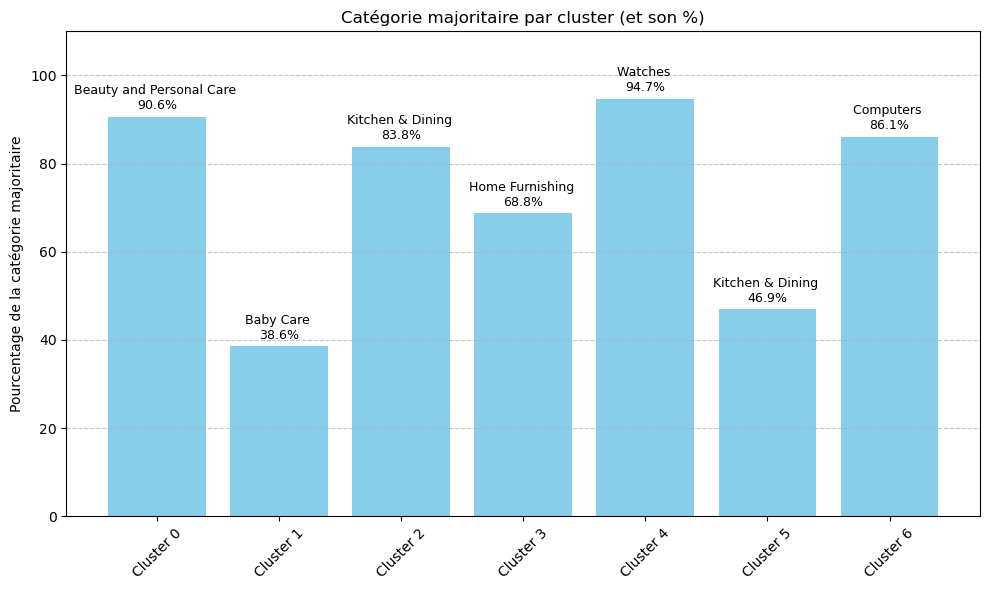

In [239]:
# Calcul : pour chaque cluster, trouver la catégorie majoritaire et son % dans ce cluster
major_categories = []
percentages = []

for i in contingency.index:
    total = contingency.loc[i].sum()
    max_cat = contingency.loc[i].idxmax()
    max_val = contingency.loc[i].max()
    percent = (max_val / total) * 100

    major_categories.append(f"{max_cat}")
    percentages.append(percent)

# Tracé du graphique
plt.figure(figsize=(10, 6))
bars = plt.bar([f"Cluster {i}" for i in contingency.index], percentages, color='skyblue')

# Ajout des annotations (noms de catégories au-dessus des barres)
for i, bar in enumerate(bars):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
             f"{major_categories[i]}\n{percentages[i]:.1f}%", 
             ha='center', va='bottom', fontsize=9)

plt.ylim(0, 110)
plt.ylabel("Pourcentage de la catégorie majoritaire")
plt.title("Catégorie majoritaire par cluster (et son %)")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

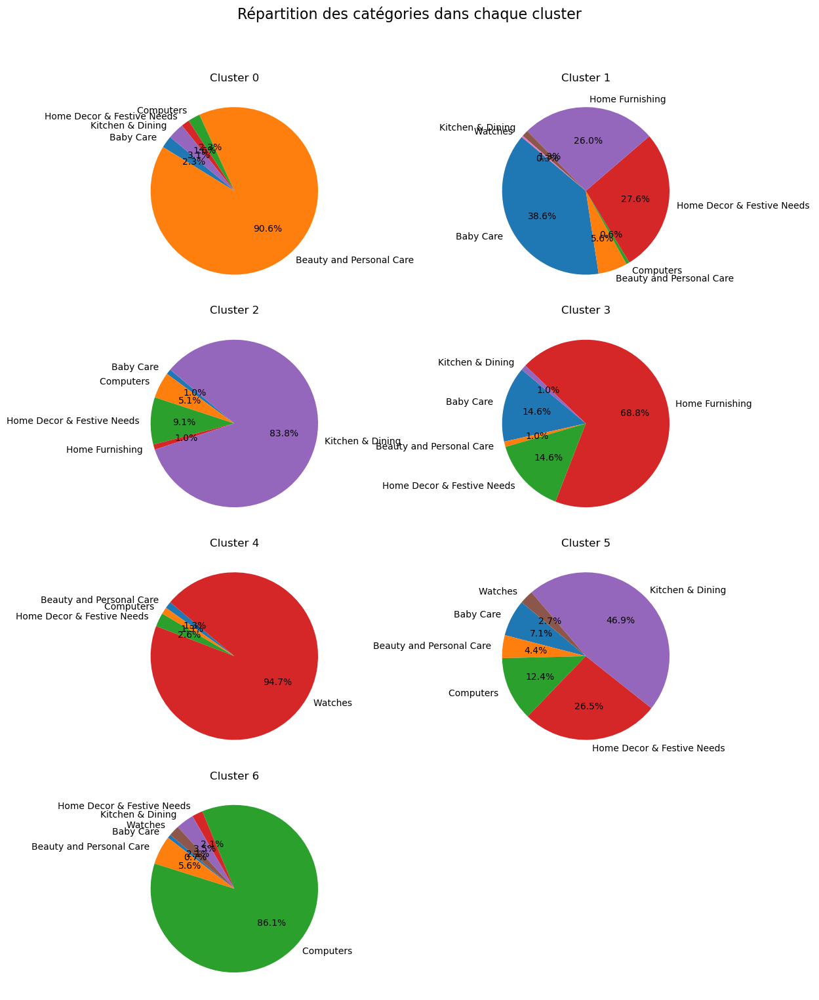

In [240]:
fig, axs = plt.subplots(4, 2, figsize=(12, 16))
axs = axs.flatten()

# Boucle sur les clusters
for i, cluster_id in enumerate(contingency.index):
    cluster_counts = contingency.loc[cluster_id]
    cluster_counts = cluster_counts[cluster_counts > 0]
    axs[i].pie(
        cluster_counts,
        labels=cluster_counts.index,
        autopct='%1.1f%%',
        startangle=140,
        textprops={'fontsize': 10}
    )
    axs[i].set_title(f"Cluster {cluster_id}", fontsize=12)

# Masquer les axes restants inutilisés
for j in range(len(contingency.index), len(axs)):
    axs[j].axis('off')

plt.suptitle("Répartition des catégories dans chaque cluster", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

Certaines catégories (“Watches”, “Home Decor & Festive Needs”) sont très bien identifiées par le clustering, avec un cluster dominant.

D’autres catégories sont plus dispersées (“Baby Care”, “Home Furnishing”), ce qui traduit soit une diversité visuelle importante, soit une similarité avec d’autres catégories.

Globalement, le clustering avec les features ResNet50 permet une séparation assez nette pour plusieurs catégories, mais il reste des mélanges, surtout pour les catégories visuellement proches ou hétérogènes.

## Choix du modèle CNN pré-entraîné EfficientNetB0

Dans la continuité de notre étude comparative des architectures CNN, nous avons sélectionné EfficientNetB0 comme troisième modèle pré-entraîné pour l’extraction de descripteurs d’images. Introduit en 2019, EfficientNetB0 marque une évolution majeure dans la conception des réseaux de neurones convolutifs, en combinant efficacité, rapidité et précision de classification.

EfficientNetB0 se distingue par une architecture optimisée à l’aide de techniques d’automatisation (NAS, Neural Architecture Search) et par l’utilisation de modules avancés tels que les blocs “squeeze-and-excitation” et la fonction d’activation Swish. Cette conception permet au modèle d’atteindre une précision de validation supérieure à celle des architectures classiques tout en conservant un nombre de paramètres et un temps d’inférence réduits. Dans plusieurs comparatifs récents, EfficientNetB0 s’est imposé comme un modèle de référence, surpassant souvent des architectures plus lourdes telles que VGG ou ResNet sur des tâches de classification d’images, tout en étant bien plus rapide à l’exécution.

L’adoption d’EfficientNetB0 dans cette étude permet ainsi de bénéficier des avancées les plus récentes en matière de deep learning pour la vision par ordinateur, et d’évaluer la pertinence de cette famille de modèles dans un contexte de regroupement non supervisé d’images. Ce choix s’inscrit dans une démarche de recherche d’efficacité, tant sur le plan de la performance que de l’utilisation des ressources informatiques.

### Préparation des données adaptée à EfficientNetB0

Pour exploiter pleinement le potentiel du modèle EfficientNetB0 pré-entraîné, il est essentiel d’adapter le prétraitement des images aux spécifications du réseau. EfficientNetB0 attend des images redimensionnées à 224×224 pixels, avec trois canaux RGB, conformément aux standards des architectures CNN modernes.

Avec les versions récentes de Keras (3.x et TensorFlow 2.19+), le prétraitement requis par EfficientNetB0 est désormais intégré directement dans le modèle via une couche de rescaling. Il n’est donc plus nécessaire d’appliquer manuellement une normalisation ou la fonction preprocess_input : il suffit de charger les images au format float32, avec des valeurs de pixels comprises dans la plage [0,], puis de les passer telles quelles dans le modèle.

Cette simplification garantit que les images d’entrée sont conformes à ce qu’attend EfficientNetB0, assurant ainsi la compatibilité et la reproductibilité des résultats. Dans cette section, nous détaillons la procédure de chargement et de redimensionnement des images, en veillant à respecter le format attendu par le modèle. Cette préparation standardisée constitue la première étape indispensable avant l’extraction des features.

In [350]:
df_efficient = df_image[['image', 'niveau_categorie_1','chemin_complet']].copy()
df_efficient.head()

,image,niveau_categorie_1,chemin_complet
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...
2,64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...
3,d4684dcdc759dd9cdf41504698d737d8.jpg,Home Furnishing,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...
4,6325b6870c54cd47be6ebfbffa620ec7.jpg,Home Furnishing,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...


In [351]:
def preprocess_efficientnetb0(image_path):
    """
    Prétraite une image pour EfficientNetB0 :
    - Charge l'image depuis le chemin,
    - Convertit en RGB,
    - Redimensionne à 224x224 pixels,
    - Transforme en tableau NumPy float32,
    Retourne un array (224, 224, 3) prêt à être passé dans le modèle.
    """
    try:
        image = Image.open(image_path).convert('RGB')
        image = image.resize((224, 224), Image.BILINEAR)
        img_np = np.array(image).astype(np.float32)
        if img_np.shape != (224, 224, 3):
            raise ValueError("L'image n'a pas le format attendu (224, 224, 3).")
        img_np = np.expand_dims(img_np, axis=0)        # Ajoute la dimension batch
        return img_np[0]                               # Retire la dimension batch
    except Exception as e:
        print(f"Erreur lors du traitement de {image_path} : {e}")
        return None

In [352]:
# Application du prétraitement à toutes les images
df_efficient['image_pretraitee'] = df_efficient['chemin_complet'].apply(preprocess_efficientnetb0)

C:\Users\joan6\anaconda3\Lib\site-packages\PIL\Image.py:3368: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


In [353]:
# Afficher la forme de la première image prétraitée non nulle
first_valid = df_efficient['image_pretraitee'].dropna().iloc[0]
print("Shape de l'image prétraitée :", first_valid.shape)

Shape de l'image prétraitée : (224, 224, 3)


In [354]:
print("Nombre d'images prétraitées :", df_efficient['image_pretraitee'].notnull().sum())
print("Nombre d'images avec erreur :", df_efficient['image_pretraitee'].isnull().sum())

Nombre d'images prétraitées : 1050
Nombre d'images avec erreur : 0


In [355]:
df_efficient.head()

,image,niveau_categorie_1,chemin_complet,image_pretraitee
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...,"[[[203.0, 199.0, 190.0], [203.0, 199.0, 189.0]..."
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...,"[[[255.0, 255.0, 255.0], [255.0, 255.0, 255.0]..."
2,64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...,"[[[255.0, 255.0, 255.0], [255.0, 255.0, 255.0]..."
3,d4684dcdc759dd9cdf41504698d737d8.jpg,Home Furnishing,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...,"[[[255.0, 255.0, 255.0], [255.0, 255.0, 255.0]..."
4,6325b6870c54cd47be6ebfbffa620ec7.jpg,Home Furnishing,C:\Users\joan6\OneDrive\Bureau\Projets\Projet_...,"[[[88.0, 83.0, 77.0], [126.0, 117.0, 114.0], [..."


### Extraction des features à l’aide d'EfficientNetB0

Après prétraitement, chaque image est passée dans EfficientNetB0 pré-entraîné, en retirant la couche de classification finale. Cette opération permet d’obtenir, pour chaque image, un vecteur de descripteurs numériques issus de la dernière couche convolutionnelle du modèle. Ces features, adaptés à la structure des images et à la distribution d’ImageNet, serviront de base aux étapes de visualisation, de réduction de dimensionnalité et de regroupement automatique. Ce procédé, identique à celui appliqué pour VGG16 et ResNet50, assure la cohérence de la comparaison entre les différentes architectures testées.

In [356]:
feature_model = EfficientNetB0(weights='imagenet', include_top=False, pooling='avg')

In [357]:
# On réutilise ici la fonction extract_features déjà créée pour VGG16,

features_list = []
for img in df_efficient['image_pretraitee']:
    if img is not None:
        features = extract_features(img, feature_model)
        features_list.append(features)
    else:
        features_list.append(None)

# Conversion en DataFrame, en gardant les catégories
valid_idx = [i for i, f in enumerate(features_list) if f is not None]
features_array = np.array([features_list[i] for i in valid_idx])
labels = df_efficient.iloc[valid_idx]['niveau_categorie_1'].values

df_features_efficient = pd.DataFrame(features_array)
df_features_efficient['niveau_categorie_1'] = labels

In [333]:
df_features_efficient.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Columns: 1281 entries, 0 to niveau_categorie_1
dtypes: float32(1280), object(1)
memory usage: 5.1+ MB


### Visualisation des catégories d’images dans l’espace des features extraits par EfficientNetB0 avec t-SNE

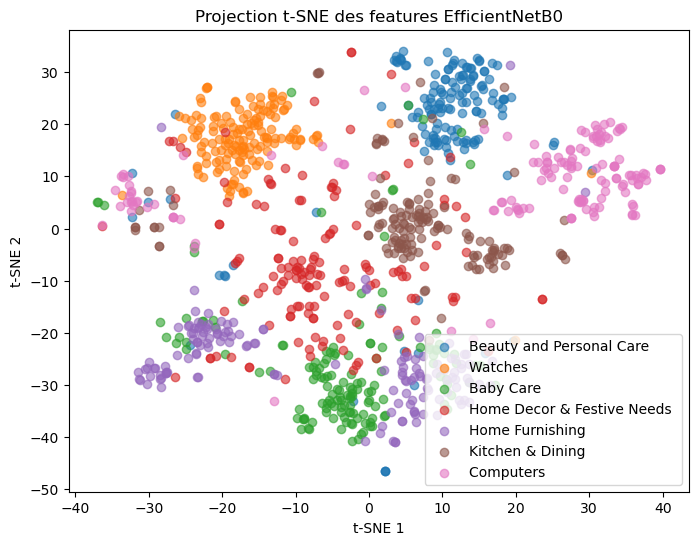

In [358]:
# Préparation des données (on enlève la colonne catégorie)
X = df_features_efficient.drop('niveau_categorie_1', axis=1).values
y = df_features_efficient['niveau_categorie_1'].values

# Standardisation des features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# t-SNE en 2D
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
X_tsne = tsne.fit_transform(X_scaled)

# Visualisation
plt.figure(figsize=(8,6))
for cat in set(y):
    idx = y == cat
    plt.scatter(X_tsne[idx, 0], X_tsne[idx, 1], label=cat, alpha=0.6)
plt.legend()
plt.title("Projection t-SNE des features EfficientNetB0")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.show()

### Réduction de dimensionnalité des features par Analyse en Composantes Principales (ACP)

Nombre de composantes pour expliquer 90% de la variance : 330


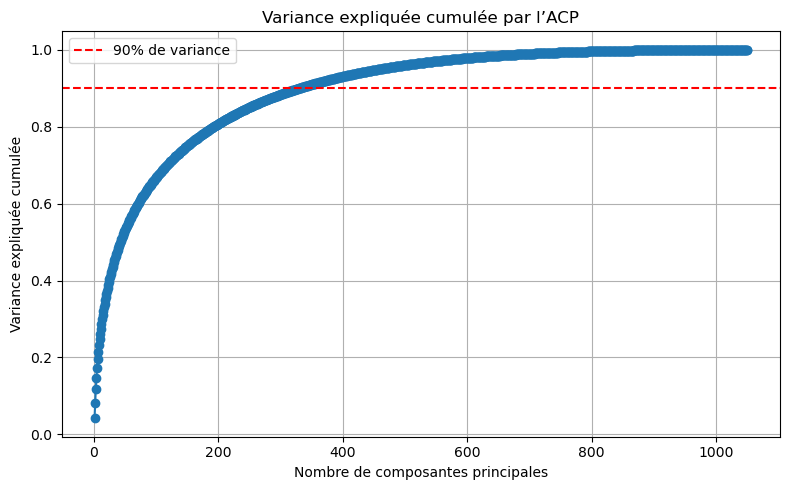

In [359]:
# PCA sans réduction (autant de composantes que de features)
pca = PCA().fit(X_scaled)

# Variance expliquée cumulée
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# Trouver le nombre de composantes nécessaires pour atteindre 90% de variance expliquée
n_components_90 = (cumulative_variance < 0.90).sum() + 1
print(f"Nombre de composantes pour expliquer 90% de la variance : {n_components_90}")

# 5. Visualisation
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o')
plt.xlabel('Nombre de composantes principales')
plt.ylabel('Variance expliquée cumulée')
plt.title('Variance expliquée cumulée par l’ACP')
plt.grid(True)
plt.axhline(y=0.90, color='r', linestyle='--', label='90% de variance')
plt.legend()
plt.tight_layout()
plt.show()

### Évaluation du regroupement automatique des images par KMeans

In [360]:
# Réduction de dimensionnalité par ACP pour expliquer 90% de la variance
pca = PCA(n_components=n_components_90, random_state=42)
X_pca = pca.fit_transform(X_scaled)

# Clustering KMeans avec k=7 sur les données réduites
kmeans = KMeans(n_clusters=7, random_state=42)
clusters = kmeans.fit_predict(X_pca)

# Calcul des scores sur les données réduites
scores = {
    'Homogénéité' : homogeneity_score(y, clusters),
    'Complétude' : completeness_score(y, clusters),
    'V-mesure' : v_measure_score(y, clusters),
    'ARI' : adjusted_rand_score(y, clusters),
    'Silhouette' : silhouette_score(X_pca, clusters)
}

# Affichage des résultats
print("Résultats du clustering KMeans (k=7) sur les features réduites par ACP :")
for metric, value in scores.items():
    print(f"- {metric} : {value:.3f}")

Résultats du clustering KMeans (k=7) sur les features réduites par ACP :
- Homogénéité : 0.633
- Complétude : 0.645
- V-mesure : 0.639
- ARI : 0.585
- Silhouette : 0.067


C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


| Méthode           | Homogeneity | Completeness | V-measure | Adjusted Rand Index | Silhouette Score |
|:------------------|:------------|:-------------|:----------|:---------------------|:-----------------|
| SIFT + BoVW  | 0.041       | 0.047        | 0.044     | 0.011                | 0.042            |
| VGG16 (features) | 0.496   | 0.518        | 0.507     | 0.417                | 0.053            |
| ResNet50 (features)| 0.552      | 0.581        | 0.566     | 0.455               | 0.029            |
| EfficientNetB0 (features) | 0.633   | 0.645        | 0.639     | 0.585                | 0.067            |


### Analyse de la répartition des catégories par cluster

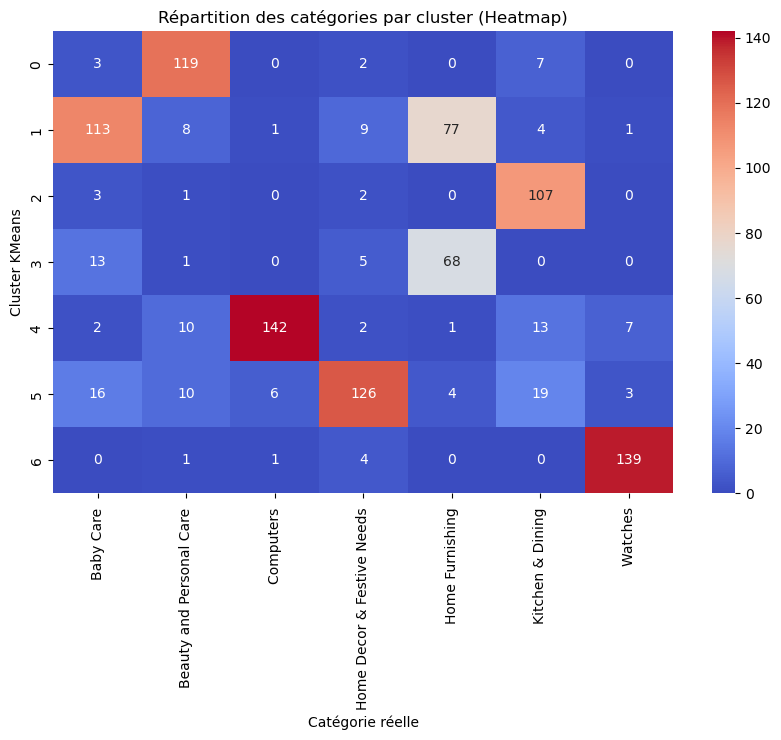

In [217]:
df_features_efficient['cluster'] = clusters

# Tableau de contingence
contingency = pd.crosstab(df_features_efficient['cluster'], df_features_efficient['niveau_categorie_1'])

plt.figure(figsize=(10, 6))
sns.heatmap(contingency, annot=True, fmt='d', cmap="coolwarm")
plt.title("Répartition des catégories par cluster (Heatmap)")
plt.xlabel("Catégorie réelle")
plt.ylabel("Cluster KMeans")
plt.show()

In [218]:
contingency.T

cluster,0,1,2,3,4,5,6
niveau_categorie_1,,,,,,,
Baby Care,3,113,3,13,2,16,0
Beauty and Personal Care,119,8,1,1,10,10,1
Computers,0,1,0,0,142,6,1
Home Decor & Festive Needs,2,9,2,5,2,126,4
Home Furnishing,0,77,0,68,1,4,0
Kitchen & Dining,7,4,107,0,13,19,0
Watches,0,1,0,0,7,3,139


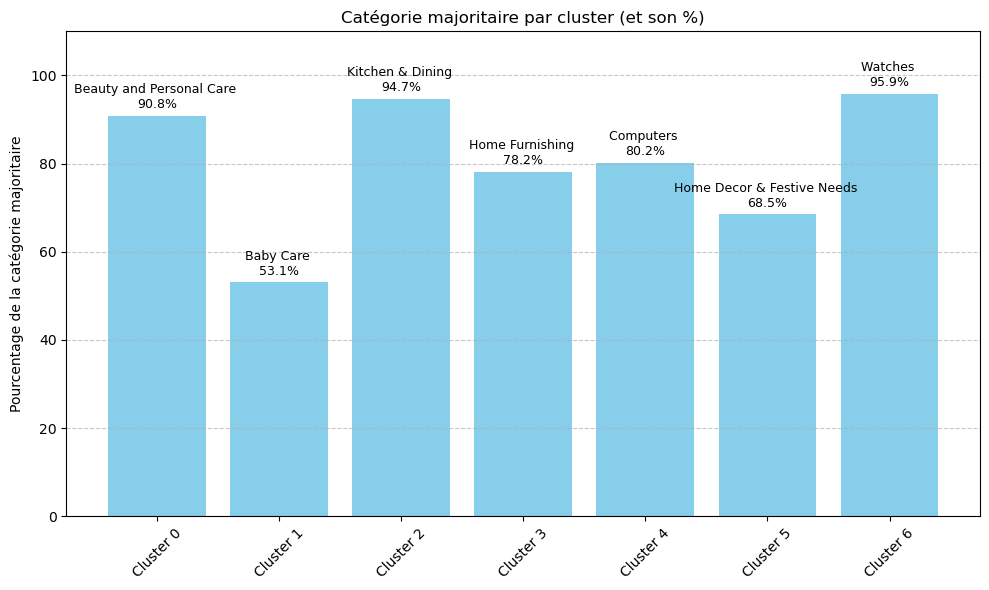

In [219]:
# Calcul : pour chaque cluster, trouver la catégorie majoritaire et son % dans ce cluster
major_categories = []
percentages = []

for i in contingency.index:
    total = contingency.loc[i].sum()
    max_cat = contingency.loc[i].idxmax()
    max_val = contingency.loc[i].max()
    percent = (max_val / total) * 100

    major_categories.append(f"{max_cat}")
    percentages.append(percent)

# Tracé du graphique
plt.figure(figsize=(10, 6))
bars = plt.bar([f"Cluster {i}" for i in contingency.index], percentages, color='skyblue')

# Ajout des annotations (noms de catégories au-dessus des barres)
for i, bar in enumerate(bars):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
             f"{major_categories[i]}\n{percentages[i]:.1f}%", 
             ha='center', va='bottom', fontsize=9)

plt.ylim(0, 110)
plt.ylabel("Pourcentage de la catégorie majoritaire")
plt.title("Catégorie majoritaire par cluster (et son %)")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

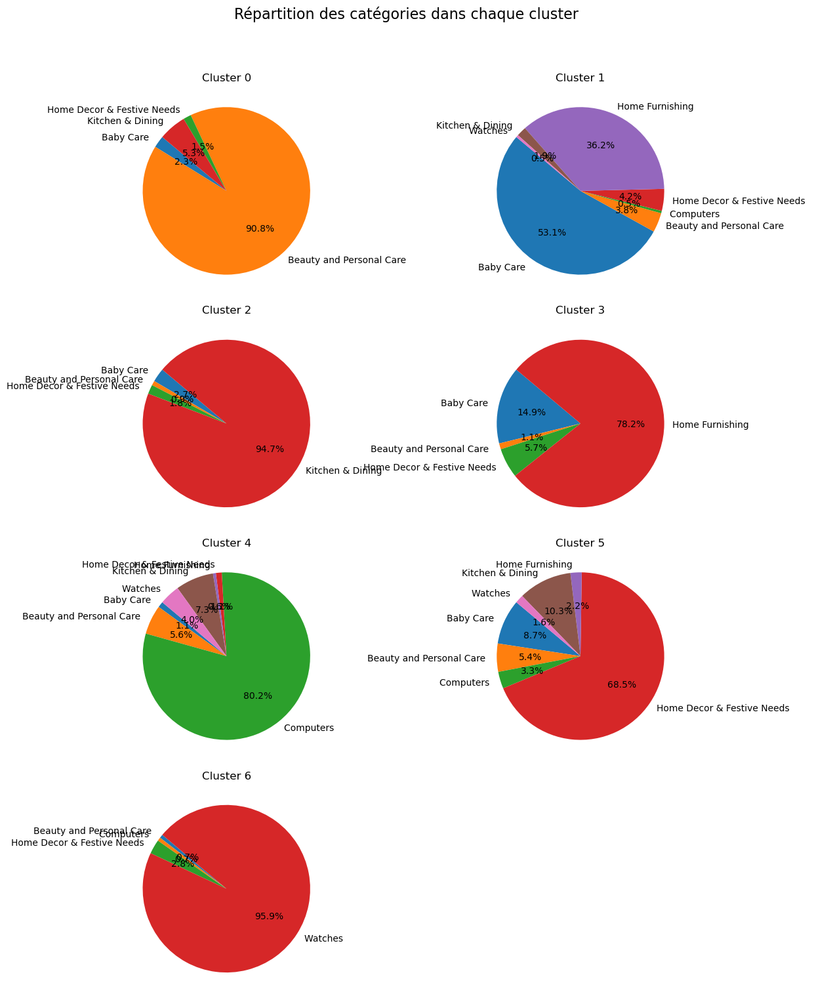

In [220]:
fig, axs = plt.subplots(4, 2, figsize=(12, 16))
axs = axs.flatten()

# Boucle sur les clusters
for i, cluster_id in enumerate(contingency.index):
    cluster_counts = contingency.loc[cluster_id]
    cluster_counts = cluster_counts[cluster_counts > 0]
    axs[i].pie(
        cluster_counts,
        labels=cluster_counts.index,
        autopct='%1.1f%%',
        startangle=140,
        textprops={'fontsize': 10}
    )
    axs[i].set_title(f"Cluster {cluster_id}", fontsize=12)

# Masquer les axes restants inutilisés
for j in range(len(contingency.index), len(axs)):
    axs[j].axis('off')

plt.suptitle("Répartition des catégories dans chaque cluster", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

Après comparaison des principales méthodes d’extraction de descripteurs (SIFT + BoVW, VGG16, ResNet50, EfficientNetB0), EfficientNetB0 offre les meilleurs résultats sur l’ensemble des métriques de clustering (homogeneity, completeness, v-measure, ARI, silhouette). Il est donc pertinent de concentrer l’optimisation sur cette architecture afin de maximiser la qualité du regroupement des images.

## Optimisation d'EfficientNetB0

Après avoir comparé différentes méthodes d’extraction de caractéristiques pour le clustering d’images, EfficientNetB0 s’est distingué par ses performances supérieures sur l’ensemble des métriques évaluées (homogeneity, completeness, v-measure, ARI, silhouette).
Dans cette section, l’objectif est d’optimiser davantage cette approche afin d’obtenir la meilleure séparation possible entre les groupes d’images.

Pour cela, je vais explorer l’impact du nombre de composantes principales retenues lors de la réduction de dimension par ACP (PCA), ainsi que l’influence des principaux paramètres de l’algorithme de clustering KMeans (nombre de clusters, initialisation, nombre d’itérations, etc.).
Cette optimisation vise à maximiser la qualité du clustering, en ajustant finement la combinaison de la réduction de dimension et du partitionnement.

Les résultats de cette optimisation permettront de valider la robustesse d’EfficientNetB0 comme descripteur d’images et d’identifier la configuration la plus performante pour le regroupement automatique des données visuelles.

In [254]:
# Fixer les seeds globaux
np.random.seed(42)
random.seed(42)

labels_true = df_features_efficient['niveau_categorie_1'].values

pipe = Pipeline([
    ('pca', PCA(random_state=42)),
    ('kmeans', KMeans(random_state=42))
])

param_grid = {
    'pca__n_components': [90, 95, 100, 105, 110],
    'kmeans__init': ['k-means++','random'],
    'kmeans__max_iter': [50, 100],
    'kmeans__n_init': [10, 20, 30, 40, 50], 
    'kmeans__n_clusters': [7]
}

results = []

for params in ParameterGrid(param_grid):
    pipe.set_params(**params)
    pipe.fit(X_scaled)
    X_reduced = pipe.named_steps['pca'].transform(X_scaled)
    labels_pred = pipe.named_steps['kmeans'].labels_
    results.append({
        **params,
        'homogeneity': homogeneity_score(labels_true, labels_pred),
        'completeness': completeness_score(labels_true, labels_pred),
        'v_measure': v_measure_score(labels_true, labels_pred),
        'adjusted_rand': adjusted_rand_score(labels_true, labels_pred),
        'silhouette': silhouette_score(X_reduced, labels_pred)
    })

results_df = pd.DataFrame(results)

# Trouver la meilleure combinaison pour la v-mesure
best_idx = results_df['adjusted_rand'].idxmax()
best_row = results_df.loc[best_idx]

C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Window

C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Window

C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Window

C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Window

In [255]:
print("Meilleure combinaison pour optimiser l'ARI' :")
print(best_row)

Meilleure combinaison pour optimiser l'ARI' :
kmeans__init          k-means++
kmeans__max_iter             50
kmeans__n_clusters            7
kmeans__n_init               10
pca__n_components           100
homogeneity            0.635219
completeness           0.648185
v_measure              0.641636
adjusted_rand          0.589392
silhouette             0.109905
Name: 2, dtype: object


| Méthode           | Homogeneity | Completeness | V-measure | Adjusted Rand Index | Silhouette Score |
|:------------------|:------------|:-------------|:----------|:---------------------|:-----------------|
| SIFT + BoVW  | 0.041       | 0.047        | 0.044     | 0.011                | 0.042            |
| VGG16 (features) | 0.496   | 0.518        | 0.507     | 0.417                | 0.053            |
| ResNet50 (features)| 0.552      | 0.581        | 0.566     | 0.455               | 0.029            |
| EfficientNetB0 (features) | 0.633   | 0.645        | 0.639     | 0.585                | 0.067            |
| EfficientNetB0 (features) opti | 0.635   | 0.648        | 0.641     | 0.589                | 0.110            |

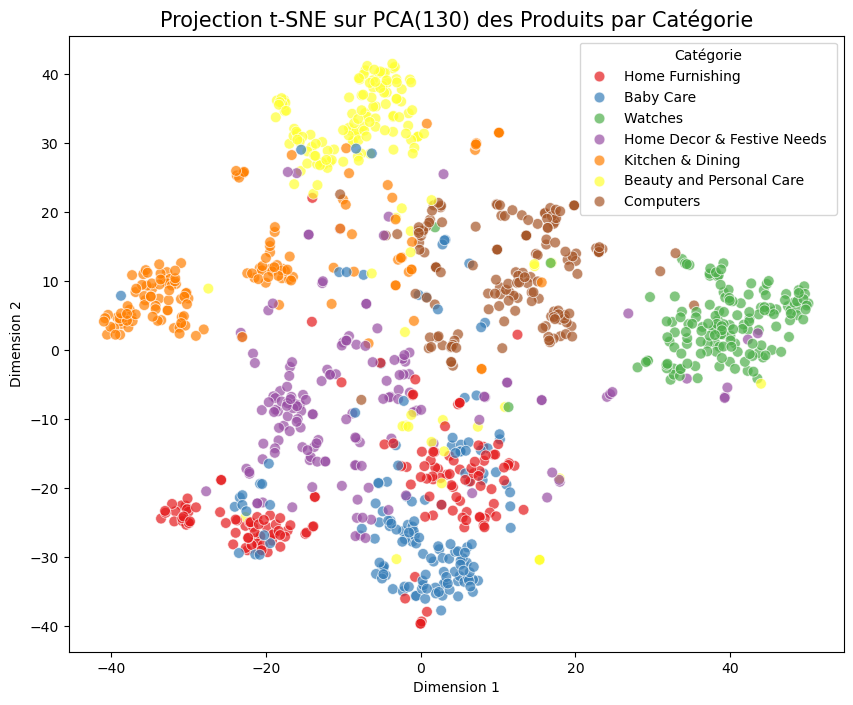

In [257]:
# 1. Applique PCA avec les meilleurs paramètres
pca = PCA(n_components=100, random_state=42)
X_pca = pca.fit_transform(X_scaled)

# 2. Applique t-SNE sur les données après PCA
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_pca)

# 3. Crée un DataFrame pour la visualisation
df_tsne = pd.DataFrame(X_tsne, columns=['TSNE-1', 'TSNE-2'])
df_tsne['niveau_categorie_1'] = df_features_efficient['niveau_categorie_1'].values

# 4. Visualisation
plt.figure(figsize=(10, 8))
sns.scatterplot(
    data=df_tsne, x='TSNE-1', y='TSNE-2',
    hue='niveau_categorie_1', palette='Set1', s=60, alpha=0.7
)
plt.title('Projection t-SNE sur PCA(100) des Produits par Catégorie', fontsize=15)
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend(title='Catégorie')
plt.show()

C:\Users\joan6\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


Homogeneity Score: 0.635
Completeness Score: 0.648
V-Measure: 0.642
Adjusted Rand Index: 0.589
Silhouette Score: 0.110


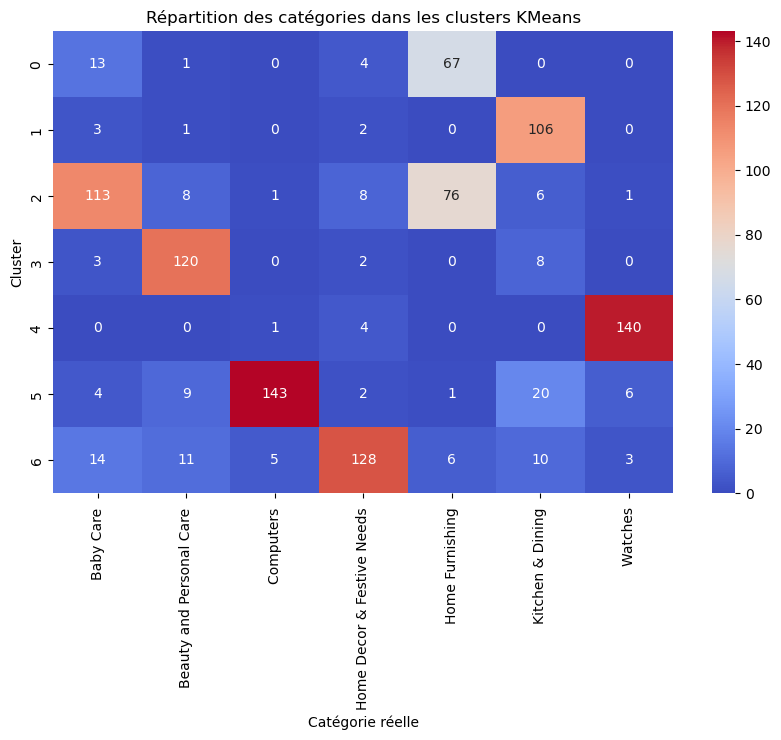

In [258]:
# KMeans avec les meilleurs paramètres
kmeans = KMeans(n_clusters=7, init='k-means++', max_iter=50, n_init=10, random_state=42)
labels_pred = kmeans.fit_predict(X_pca)

# Crosstab pour analyser la répartition
df_clusters = pd.DataFrame({
    'cluster': labels_pred,
    'categorie': df_features_efficient['niveau_categorie_1'].values
})

# Calcul des scores
homogeneity = homogeneity_score(df_clusters['categorie'], labels_pred)
completeness = completeness_score(df_clusters['categorie'], labels_pred)
v_measure = v_measure_score(df_clusters['categorie'], labels_pred)
ari = adjusted_rand_score(df_clusters['categorie'], labels_pred)
silhouette = silhouette_score(X_pca, labels_pred)

# Affichage des scores
print(f"Homogeneity Score: {homogeneity:.3f}")
print(f"Completeness Score: {completeness:.3f}")
print(f"V-Measure: {v_measure:.3f}")
print(f"Adjusted Rand Index: {ari:.3f}")
print(f"Silhouette Score: {silhouette:.3f}")

contingency = pd.crosstab(df_clusters['cluster'], df_clusters['categorie'])

# Heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(contingency, annot=True, fmt="d", cmap="coolwarm")
plt.title("Répartition des catégories dans les clusters KMeans")
plt.xlabel("Catégorie réelle")
plt.ylabel("Cluster")
plt.show()

In [259]:
contingency.T

cluster,0,1,2,3,4,5,6
categorie,,,,,,,
Baby Care,13,3,113,3,0,4,14
Beauty and Personal Care,1,1,8,120,0,9,11
Computers,0,0,1,0,1,143,5
Home Decor & Festive Needs,4,2,8,2,4,2,128
Home Furnishing,67,0,76,0,0,1,6
Kitchen & Dining,0,106,6,8,0,20,10
Watches,0,0,1,0,140,6,3


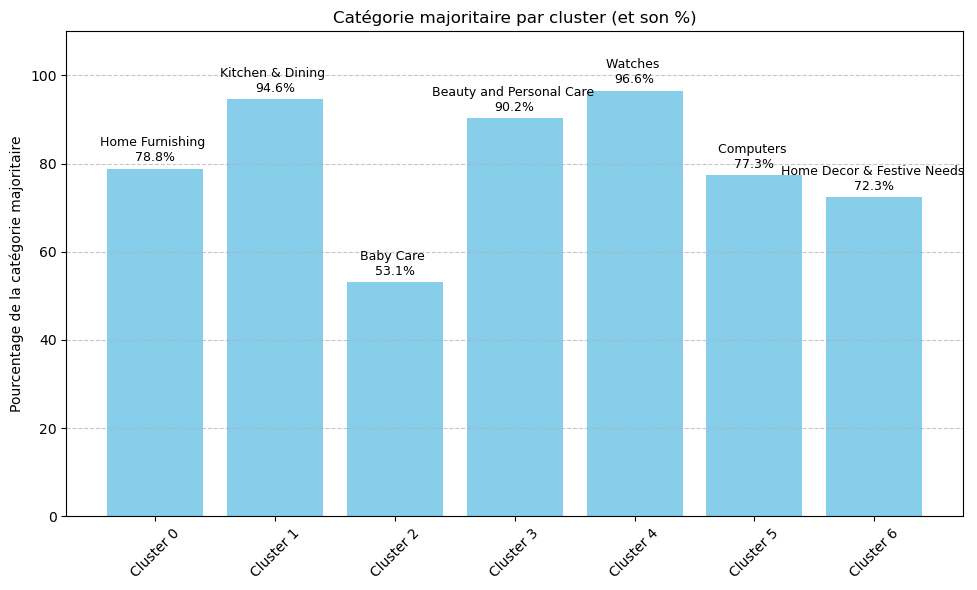

In [260]:
# Calcul : pour chaque cluster, trouver la catégorie majoritaire et son % dans ce cluster
major_categories = []
percentages = []

for i in contingency.index:
    total = contingency.loc[i].sum()
    max_cat = contingency.loc[i].idxmax()
    max_val = contingency.loc[i].max()
    percent = (max_val / total) * 100

    major_categories.append(f"{max_cat}")
    percentages.append(percent)

# Tracé du graphique
plt.figure(figsize=(10, 6))
bars = plt.bar([f"Cluster {i}" for i in contingency.index], percentages, color='skyblue')

# Ajout des annotations (noms de catégories au-dessus des barres)
for i, bar in enumerate(bars):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
             f"{major_categories[i]}\n{percentages[i]:.1f}%", 
             ha='center', va='bottom', fontsize=9)

plt.ylim(0, 110)
plt.ylabel("Pourcentage de la catégorie majoritaire")
plt.title("Catégorie majoritaire par cluster (et son %)")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

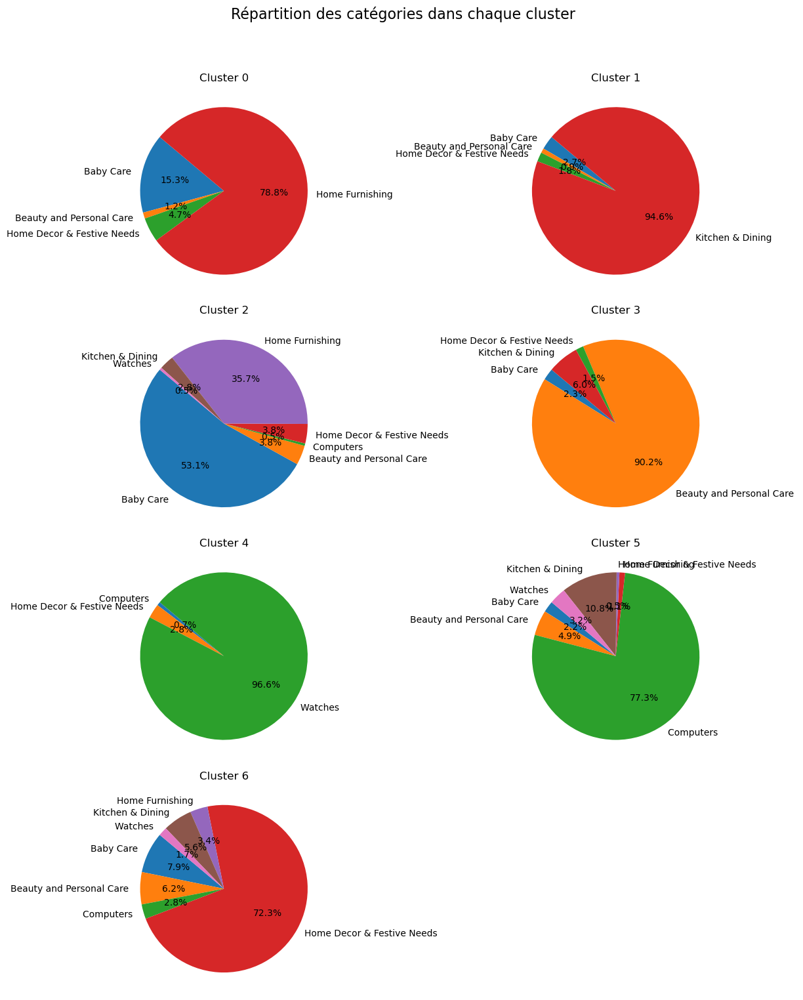

In [261]:
# On définit la grille de subplots (4 lignes x 2 colonnes pour 7 clusters + 1 vide)
fig, axs = plt.subplots(4, 2, figsize=(12, 16))
axs = axs.flatten()  # On aplatit pour accéder facilement aux axes avec un index

# Boucle sur les 7 clusters
for i, cat in enumerate(contingency.index):
    cluster_counts = contingency.loc[cat]
    cluster_counts = cluster_counts[cluster_counts > 0]

    axs[i].pie(
        cluster_counts,
        labels=cluster_counts.index,
        autopct='%1.1f%%',
        startangle=140,
        textprops={'fontsize': 10}
    )
    axs[i].set_title(f"Cluster {cat}", fontsize=12)

# Supprimer le dernier subplot vide (le 8e)
for j in range(len(contingency.index), len(axs)):
    fig.delaxes(axs[j])

plt.suptitle("Répartition des catégories dans chaque cluster", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

Nombre d'images mal classées : 233


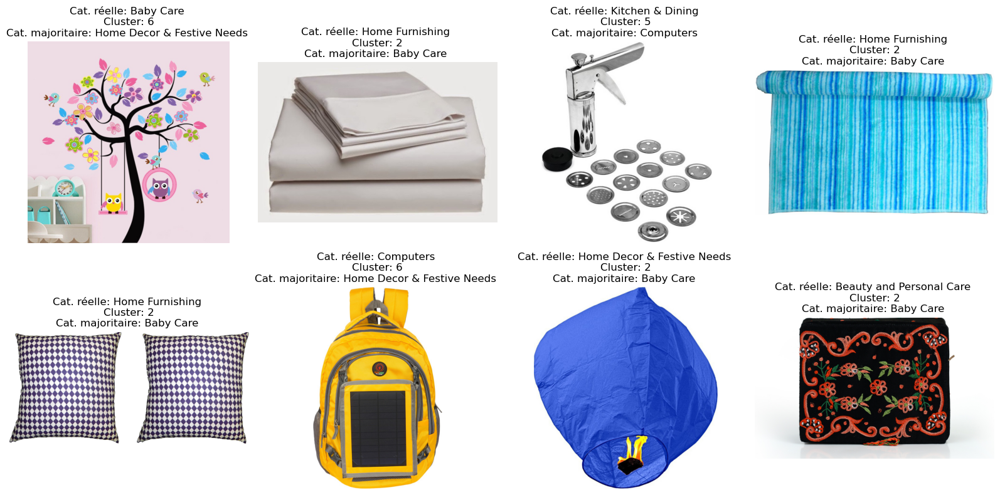

In [269]:
# Ajout du cluster prédit au DataFrame
df_efficient['cluster_pred'] = labels_pred

# Trouver la catégorie majoritaire de chaque cluster
majority_categories = (
    df_efficient.groupby('cluster_pred')['niveau_categorie_1']
    .agg(lambda x: x.value_counts().idxmax())
    .to_dict()
)

# Ajouter la catégorie majoritaire à chaque ligne
df_efficient['cluster_majority_category'] = df_efficient['cluster_pred'].map(majority_categories)

# Sélectionner les images mal classées (catégorie réelle ≠ catégorie majoritaire du cluster)
mal_classes = df_efficient[
    df_efficient['niveau_categorie_1'] != df_efficient['cluster_majority_category']
]

print(f"Nombre d'images mal classées : {len(mal_classes)}")

# Afficher quelques exemples d'images mal classées
n_examples = 8  # nombre d'images à afficher

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.flatten()

for i, (idx, row) in enumerate(mal_classes.sample(n=min(n_examples, len(mal_classes))).iterrows()):
    img = plt.imread(row['chemin_complet'])  
    axes[i].imshow(img)
    axes[i].axis('off')
    axes[i].set_title(
        f"Cat. réelle: {row['niveau_categorie_1']}\nCluster: {row['cluster_pred']}\nCat. majoritaire: {row['cluster_majority_category']}"
    )

plt.tight_layout()
plt.show()

Catégories bien séparées
- Computers : 143/150 dans le cluster 5 → séparation quasi parfaite.

- Watches : 140/150 dans le cluster 4 → excellente séparation.

- Home Decor & Festive Needs : 128/150 dans le cluster 6 → très bon regroupement.

- Beauty and Personal Care : 120/150 dans le cluster 3 → bonne séparation.

Catégories plus diffuses
- Home Furnishing : réparti principalement entre clusters 0 (67) et 2 (76), donc la catégorie est divisée en deux groupes principaux, ce qui suggère une diversité visuelle importante au sein de cette catégorie.

- Kitchen & Dining : 106/150 dans le cluster 1, mais le reste est dispersé, ce qui montre une séparation partielle.

- Baby Care : 113/150 dans le cluster 2, mais 14 dans le cluster 6 et quelques-uns ailleurs, donc catégorie assez bien regroupée mais avec une dispersion notable.

Certaines catégories visuelles, comme Computers, Watches, Home Decor & Festive Needs et Beauty and Personal Care, sont très bien regroupées dans des clusters distincts. Cela indique que les caractéristiques extraites par EfficientNetB0 permettent d’identifier efficacement ces catégories à partir de l’image seule.

D’autres catégories, comme Home Furnishing et Kitchen & Dining, présentent une plus grande diversité visuelle, ce qui se traduit par une répartition sur plusieurs clusters. Cela suggère soit une hétérogénéité des images au sein de ces catégories, soit une proximité visuelle avec d’autres catégories, rendant leur séparation plus difficile en non supervisé.

En résumé :
Le clustering basé sur les images permet de distinguer clairement certaines catégories, mais montre ses limites pour les groupes visuellement proches ou hétérogènes. 

# Conclusion générale : Étude de faisabilité du moteur de classification automatique d'articles

Cette étude a exploré la possibilité de créer un moteur de classification automatique d'articles en utilisant à la fois les descriptions textuelles et les images des produits. Les résultats montrent une complémentarité intéressante entre ces deux types de données, chacun capturant des aspects spécifiques des catégories d'articles.


| **Catégorie**               | **Bien séparée par le texte** | **Bien séparée par l’image** | **Commentaire clé**                               |
|:----------------------------|:------------------------------|:----------------------------|:-------------------------------------------------|
| **Watches**                 | ✅                            | ✅                          | Parfait dans les deux modalités                 |
| **Computers**               | ✅                            | ✅                          | Parfait dans les deux modalités                 |
| **Home Furnishing**         | ✅                            | ❌                          | Texte très bon, image divisée                   |
| **Home Decor & Festive**    | ✅                            | ✅                          | Bonne séparation dans les deux                 |
| **Beauty and Personal Care**| ❌                            | ✅                          | Image meilleure, texte ambigu                   |
| **Baby Care**               | ❌                            | ❌                          | Ambigu dans les deux, à améliorer               |
| **Kitchen & Dining**        | ❌                            | ❌                          | Ambigu dans les deux, à améliorer               |

**Descriptions textuelles :**<br>
Les descriptions textuelles sont particulièrement efficaces pour identifier des catégories très spécifiques et bien définies, comme Watches, Computers, Home Furnishing et Home Decor & Festive Needs, où les mots-clés et les termes spécifiques aux produits permettent de bien séparer les groupes. Cependant, pour des catégories plus larges ou ambiguës, telles que Baby Care, Beauty and Personal Care, et Kitchen & Dining, les descriptions textuelles montrent des chevauchements importants. Cela suggère que certaines catégories partagent des caractéristiques sémantiques similaires, rendant la séparation plus difficile.

**Images :**<br>
Les résultats du clustering basé sur les images révèlent une bonne séparation pour des catégories où les différences visuelles sont marquées, comme Computers, Watches, Home Decor & Festive Needs, et Beauty and Personal Care. Toutefois, des catégories comme Home Furnishing et Kitchen & Dining sont plus difficiles à isoler visuellement en raison de leur diversité visuelle interne ou de leur proximité visuelle avec d'autres catégories. Cela montre que les images peuvent capturer des différences qui ne sont pas toujours bien saisies par les descriptions textuelles, et vice versa.

**Complémentarité entre texte et image :**<br>
L'approche combinée des données textuelles et visuelles permettrait de surmonter les limites de chaque méthode. Par exemple, Baby Care et Beauty and Personal Care, qui sont difficiles à distinguer uniquement par le texte, pourraient bénéficier d'une classification visuelle plus précise. Inversement, des catégories comme Computers et Watches, qui sont bien capturées par le texte, seraient renforcées par l'apport des caractéristiques visuelles. En combinant les deux sources de données, le moteur de classification pourrait mieux gérer les ambiguïtés et améliorer la séparation des catégories plus complexes.

**Conclusion :**<br>
Les descriptions textuelles et les images ont chacune leurs points forts dans la classification des articles. Tandis que les descriptions textuelles permettent de bien séparer les catégories spécifiques et bien définies, les images capturent des différences visuelles importantes que le texte seul ne peut pas saisir. 

Les résultats démontrent qu’un moteur de classification automatique d’articles, basé sur l’image et la description, est faisable et prometteur. Les performances actuelles en non supervisé sont déjà suffisantes pour des catégories bien définies, tandis que les limites observées pour les catégories ambiguës ouvrent la voie à des améliorations ciblées. Une approche multimodale ou supervisée permettrait de renforcer la précision du système, garantissant son déploiement efficace dans un contexte réel.